# Visualize Experiments

## SetUp

In [330]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib
import json
from pathlib import Path
import seaborn as sns
import pandas as pd
from scipy.ndimage.filters import uniform_filter1d
import scipy.stats as stats
from tqdm import tqdm
import re
import sys
sys.path.append('..')
# import neatplot
# neatplot.set_style()
# neatplot.update_rc('font.size', 20)
# matplotlib.rcParams['text.usetex'] = True
# plt.rc('text.latex', preamble=r'\usepackage{amsmath}\DeclareMathOperator{\EIG}{EIG}')
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go

/tmp/ipykernel_77661/1677604477.py:9: DeprecationWarning:

Please use `uniform_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.



In [331]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams.update({'font.size': 14})

In [332]:
# sns.set_theme()

In [333]:
base_path = Path('../')
baseline_path = Path('../../bac-baselines/experiments')
base_hucrl_path = Path('../../hucrl/exps/mujoco/experiments')
process_seeds = True

## Environment

In [334]:
# env_name = "Pendulum"
env_name = "Lorenz-noisy"
# env_name = "Lorenz"
# env_name = "Pendulum-extra"

## Paths

In [335]:
pend_paths = {
#     'EXTRA': 'experiments/barl_pendulum_100_2023-08-25/19-06-08/',
    
    'BARL-1000': 'experiments_cache/barl_original_pendulum/compare_orig_1000_2023-05-16/09-54-53/',
    'BARL-100': 'experiments_cache/barl_original_pendulum/compare_orig_100_2023-05-16/16-28-26/',
    'BARL-50': 'experiments_cache/barl_original_pendulum/compare_orig_50_2023-05-16/22-22-41/',
    'BARL-10':'experiments_cache/barl_original_pendulum/compare_orig_10_2023-05-19/18-15-45/',
    
    'OPT-1000': 'experiments_cache/barl_optimised_pendulum/compare_opt_1000_2023-05-16/09-57-11/',
    'OPT-100': 'experiments_cache/barl_optimised_pendulum/compare_opt_100_2023-05-16/15-41-43/',
    'OPT-50': 'experiments_cache/barl_optimised_pendulum/compare_opt_50_2023-05-16/21-16-50/',
    'OPT-10':'experiments_cache/barl_optimised_pendulum/compare_opt_10_2023-05-20/00-48-58/',
    
    'ROLL-1000': 'experiments_cache/barl_rollout_pendulum/rollout_barl_1000_buffer/buffer/',
    'ROLL-100':'experiments_cache/barl_rollout_pendulum/rollout_barl_100_buffer/buffer/',
    'ROLL-50':'experiments_cache/barl_rollout_pendulum/rollout_barl_50_buffer/buffer/',
    'ROLL-10':'experiments_cache/barl_rollout_pendulum/rollout_barl_10_2023-05-20/06-33-38/',
    
#     'IDENTITY-100': 'experiments_cache/barl_rollout_pendulum/barl_pendulum_identity_100/iters_150_identity_gp/',
        
        }

In [336]:
pend_extra_paths = {
    
    'BARL-1000': 'experiments/barl_pendulum_1000_2023-08-26/23-10-51/',
    'BARL-100': 'experiments/barl_pendulum_100_2023-08-26/22-40-03/',
    'BARL-50': 'experiments/barl_pendulum_50_2023-08-26/22-38-58/',
    'BARL-10':'experiments/barl_pendulum_10_2023-08-26/22-07-17/',
    
    'OPT-1000': 'experiments/opt_pendulum_1000_2023-08-27/03-20-31/',
    'OPT-100': 'experiments/opt_pendulum_100_2023-08-27/02-18-31/',
    'OPT-50': 'experiments/opt_pendulum_50_2023-08-27/02-13-42/',
    'OPT-10':'experiments/opt_pendulum_10_2023-08-27/02-03-39/',
    
    'ROLL-1000': 'experiments/roll_pendulum_1000_2023-08-27/01-15-05/',
    'ROLL-100':'experiments/roll_pendulum_100_2023-08-27/01-10-42/',
    'ROLL-50':'experiments/roll_pendulum_50_2023-08-27/00-38-46/',
    'ROLL-10':'experiments/roll_pendulum_10_2023-08-26/23-10-37/',
    
        }

In [337]:
lorenz_paths = {
    ### BARL STATIC INITIAL CONDITION
#     'BARL-FIXED-100': 'experiments_cache/barl_original_lorenz/barl_lorenz_100/iters_300_fixed/',
#     'BARL-FIXED-50': 'experiments_cache/barl_original_lorenz/barl_lorenz_50/iters_300_fixed/',
    
    'BARL-1000': 'experiments_cache/barl_original_lorenz/barl_lorenz_1000/iters_150_fixed_short/',
    'BARL-100': 'experiments_cache/barl_original_lorenz/barl_lorenz_100/iters_150_fixed_short/',
    'BARL-50': 'experiments_cache/barl_original_lorenz/barl_lorenz_50/iters_150_fixed_short/',
    'BARL-10': 'experiments_cache/barl_original_lorenz/barl_lorenz_10/iters_150_fixed_short/',
    
    
    ### OPTIMISED STATIC INITIAL CONDITION
#     'OPT-FIXED-100': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_100/iters_300_fixed/',
#     'OPT-FIXED-50': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_50/iters_300_fixed/',
    
    'OPT-1000': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_1000/iters_150_fixed_short/',
    'OPT-100': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_100/iters_150_fixed_short/',
    'OPT-50': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_50/iters_150_fixed_short/',
    'OPT-10': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_10/iters_150_fixed_short/',
         
    ### ROLLOUT STATIC INITIAL CONDITION
#     'ROLLOUT-FIXED-100': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_100/iters_300_fixed/',
#     'ROLLOUT-FIXED-50': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_50/iters_300_fixed/',
    
    'ROLL-1000': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_1000/iters_400_fixed_short/',
    'ROLL-100': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_100/iters_400_fixed_short/',
    'ROLL-50': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_50/iters_400_fixed_short/',
    'ROLL-10': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_10/iters_400_fixed_short/',

}

In [338]:
lorenz_noisy_paths = {
    ### NOISY INITIAL CONDITION
    'BARL-100': 'experiments_cache/barl_original_lorenz/barl_lorenz_100/iters_150_noisy_short/',
    'BARL-50': 'experiments_cache/barl_original_lorenz/barl_lorenz_50/iters_150_noisy_short/',
    
    'OPT-100': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_100/iters_150_noisy_short/',
    'OPT-50': 'experiments_cache/barl_optimised_lorenz/o_barl_lorenz_50/iters_150_noisy_short/',
    
    'ROLL-100': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_100/iters_400_noisy_short/',
    'ROLL-50': 'experiments_cache/barl_rollout_lorenz/r_barl_lorenz_50/iters_400_noisy_short/',
}

In [173]:
halfcheetah_paths = {
    'OPT': 'origin_halfcheetah_2023-05-02/test/',
    'OPT-BARL': 'opt_halfcheetah_2023-05-02/test/',
}

In [174]:
cartpole_paths = {
         # 'BAC': 'cartpole_multistart_2021-08-20/12-52-46/',
         'TIP': 'rollout_cartpole_2022-05-05/18-53-31/',
         'sTIP': 'sum_barl_cartpole_2022-05-10/18-23-29/',
         'BARL': 'bac_cartpole_2021-09-30/10-06-18/',
         # 'RQMPC': 'random_cartpole_2021-09-30/14-41-06/',
         'DIP': 'rus_cartpole_2022-05-14/18-59-34/',
         'sDIP': 'sus_cartpole_2022-05-14/18-22-14/',
         r'$\EIG_T$': 'us_cartpole_2021-10-02/18-03-05/',
         'MPC': 'mbrl_cartpole_2021-09-30/14-23-08/',
         
         # 'RUS': 'default_2022-05-13/09-49-33/',
         # 'RUS2': 'default_2022-05-14/13-01-19/'
         # 'Rollout BAC': 'cartpole_multistart_rollout_bac_2021-08-19/17-59-03/',
         # 'PETS': 'pets_cartpole_2021-09-26/12-17-26/',
         # 'KGRL': 'kgrl_cartpole_3init_2021-12-29/15-04-25/',
         # 'SAC': 'sac_cartpole_2021-09-30/12-46-23/',
         # 'TD3': 'td3_cartpole_2021-10-01/11-59-14/',
         # 'PPO': 'ppo_cartpole_2021-10-01/13-04-31/',
         # 'Rollout BARL': 'fast_rollout_bac_cartpole_2022-01-23/12-06-50',
         
         # Open Loop BARL': 'cartpole_open_loop_fixed_2022-02-08/11-47-42/',
         # 'BARL (New)': 'no_bayes_cartpole_barl_2022-03-27/12-45-16/',
         # 'BARL (Bayes)': 'bayes_cartpole_barl_2022-03-27/13-57-28/',
         # 'HUCRL': 'hucrl_cartpole_2022-05-05/18-57-44/',
         # 'TS': 'hucrl_cartpole_thompson_2022-05-05/18-57-44/',
         # 'HUCRL (greedy)': 'hucrl_cartpole_greedy_2022-05-05/18-57-44/',
}

In [175]:
lava_paths = {
        # 'BAC': 'bac_lava_path_2021-09-09/10-57-31/',
        'BARL': 'bac_lava_path_2021-09-25/11-47-59/',
        # 'RQMPC': 'random_lava_path_2021-09-30/22-58-35/',
        'MPC': 'mbrl_lava_path_2021-09-25/14-30-03/',
        r'US': 'us_lava_path_2021-10-02/18-27-22/',
        'PETS': 'pets_lava_path_2021-10-03/11-17-05/',
        'SAC': 'sac_lava_path_2021-09-30/12-45-03/',
        'TD3': 'td3_lava_path_2021-10-01/12-06-39/',
        'PPO': 'ppo_lava_path_2021-10-01/17-35-57/',
}

In [176]:
short_lava_paths = {
        'oTIP': 'otip_short_lava_2023-04-20/13-26-27/',
        'oMPC': 'open_loop_mpc_short_lava_2023-04-20/13-39-03/',
        'oDIP': 'open_loop_us_short_lava_2023-04-20/13-41-43/',
        'BARL': 'barl_short_lava_2023-04-20/13-44-44/',
        # 'PETS': 'pets_lava_path_2023-04-20/11-17-05/',
        # 'SAC': 'sac_lava_path_2021-09-30/12-45-03/',
        # 'TD3': 'td3_lava_path_2021-10-01/12-06-39/',
        # 'PPO': 'ppo_lava_path_2021-10-01/17-35-57/',
        # r'$EIG_T$': 'eigt_short_lava_2023-04-20/14-20-36/'
}

In [177]:
reacher_paths = {
        # 'BAC (uniform)': 'bac_reacher_2021-09-01/17-14-04/',
        # 'BAC (path sampling)': 'bac_reacher_rand_2021-09-01/17-14-02/',
        
        # 'BAC (ARD)': 'ard_reacher_bac_2021-09-18/14-59-33/',
        # 'BAC (periodic ARD)':'reacher_periodic_bac_2021-09-18/15-26-28/',
        # 'BAC (heavy path)': 'bac_reacher_heavy_paths_2021-09-27/09-48-01/',
        # 'BAC (noisy heavy path)': 'bac_reacher_noisy_heavy_path_2021-09-29/13-21-31',
        'TIP': 'rollout_reacher_2022-02-04/10-28-59/',
        'sTIP': 'sum_barl_reacher_2022-05-10/18-25-38/',
        'BARL': 'bac_reacher_2021-09-29/10-38-12/',
        'DIP': 'rus_reacher_2022-05-16/21-07-35/', ## this is one seed, the next one is currently comnig
        'sDIP': 'sus_reacher_2022-05-16/10-25-57/',
        r'$\EIG_T$': 'us_reacher_2021-10-03/12-01-24/',
        # 'RQMPC': 'random_reacher_2021-10-01/16-03-06/',
        'MPC': 'mbrl_reacher_2021-09-30/22-54-56/',
        
        # 'Sum TIP': 'sum_barl_reacher_2022-05-10/18-25-38/',
        # 'PETS': 'pets_reacher_2021-09-30/17-18-38/',
        # 'SAC': 'sac_reacher_2021-09-30/17-29-38/',
        # 'TD3': 'td3_reacher_2021-10-01/11-53-22/',
        # 'PPO': 'ppo_reacher_2021-09-30/19-36-17/',
        # 'HUCRL': 'hucrl_reacher_2022-05-05/16-17-43/',
        # 'TS': 'hucrl_reacher_thompson_2022-05-05/16-17-43/',
        # 'HUCRL (greedy)': 'hucrl_reacher_greedy_2022-05-05/16-17-43/',
        
}

In [178]:
beta_tracking_paths = {
        'TIP': 'rollout_beta_tracking_2022-02-04/10-23-51/',
        'sTIP': 'sum_barl_beta_tracking_2022-05-14/13-51-51/',
        'BARL': 'bac_beta_tracking_2021-09-25/12-14-51/',
        'DIP': 'rus_barl_beta_tracking_2022-05-15/13-43-47/',
        'sDIP': 'sus_barl_beta_tracking_2022-05-15/12-22-34/',
        r'$\EIG_T$': 'us_beta_tracking_2021-10-02/22-41-29/',
        'MPC': 'mbrl_beta_tracking_2021-09-25/13-57-02/',
        # 'PETS': 'pets_beta_tracking_2021-10-03/11-23-07/',
        # 'SAC': 'sac_beta_tracking_2021-10-04/11-17-56/',
        # 'TD3': 'td3_beta_tracking_2022-05-10/17-01-17/',
        # 'PPO': 'ppo_beta_tracking_2021-10-04/13-17-42/',

        # 'HUCRL': 'hucrl_beta_tracking_2022-04-22/12-16-34/',
        # "TS": 'hucrl_beta_tracking_thompson_2022-05-05/19-19-46/',
        # 'HUCRL (greedy)': 'hucrl_beta_tracking_greedy_2022-04-22/02-25-54/',
        
}

In [179]:
beta_rotation_paths = {
    'TIP': 'tip_beta_rotation_tracking_2022-05-10/14-08-44/',
    'sTIP': 'sum_barl_beta_rotation_tracking_2022-05-14/13-52-46/',
    'BARL': 'barl_beta_rotation_tracking_2022-05-10/14-08-27/',
    'DIP': 'rus_beta_rotation_tracking_2022-05-16/12-47-05/',
    'sDIP': 'sus_beta_rotation_tracking_2022-05-16/10-30-28/',
    r'$\EIG_T$': 'us_beta_rotation_tracking_2022-05-10/15-34-29/',
    'MPC': 'mpc_beta_rotation_tracking_2022-05-10/14-09-36/',

    # 'PETS': 'pets_beta_rotation_tracking_2022-05-09/21-38-53/',
    # 'SAC': 'sac_beta_rotation_tracking_2022-05-10/10-38-04/',
    # 'TD3': 'td3_beta_rotation_tracking_2022-05-10/14-30-48/',
    # 'PPO': 'ppo_beta_rotation_tracking_2022-05-10/16-57-30/',
    # 'HUCRL': 'hucrl_beta_rotation_tracking_2022-05-10/11-13-00/',
    # 'TS': 'hucrl_beta_rotation_tracking_thompson_2022-05-09/22-02-42/',
    # 'HUCRL (greedy)': 'hucrl_beta_rotation_tracking_greedy_2022-05-10/04-46-01/',
}

In [180]:
weird_gain_paths = {
    # 'BARL': 'weird_gain_barl_2022-02-12/23-15-12/',
    # 'Open Loop BARL': 'weird_gain_open_loop_barl_2022-02-17/10-01-50/',
    # 'Rollout BARL': 'weird_gain_rollout_barl_2022-02-12/23-15-16/',
    # 'Start State BARL': 'weird_gain_ss_barl_2022-02-12/23-15-10/',
    # 'SAS BARL': 'weird_gain_ss_barl3mc_sas_2022-02-22/08-55-27/',
    # 'MBRL': 'weird_gain_mpc_2022-02-12/23-15-08/',
    # r'$EIG_T$': 'weird_gain_us_2022-02-12/23-15-08/',
    
    # 'Bayesian Optimization': 'sklearn_opt_weird_gain_2022-02-16/22-55-50/',
    # 'BARL (recent)': 'no_bayes_weird_gain_2022-03-27/11-41-53/',
    # 'BARL (Bayes)': 'bayes_weird_gain_2022-03-27/12-23-23/',
    
    'oTIP': 'open_loop_bac_weird_gain_2022-05-03/12-13-26/',
    'oMPC': 'open_loop_mpc_weird_gain_2022-05-03/12-20-04/',
    r'oDIP': 'open_loop_us_weird_gain_2022-05-03/12-21-41/',
    'BO': 'bayes_opt_weird_gain_2022-04-22/13-07-56/',
}

In [181]:
weirder_gain_paths = {
    'oTIP': 'open_loop_bac_weirder_gain_2022-05-15/17-58-06/',
    'oMPC': 'open_loop_mpc_weirder_gain_2022-05-15/18-27-20/',
    r'oUS': 'open_loop_us_weirder_gain_2022-05-15/18-29-40/',
    'BO': 'bayes_opt_weirder_gain_2022-05-15/17-59-22/',
}

In [182]:
beta_tracking_fixed_paths = {
    'oTIP': 'open_loop_bac_beta_tracking_fixed_2022-05-15/18-26-44/',
    'oMPC': 'open_loop_mpc_beta_tracking_fixed_2022-05-15/19-02-39/',
    r'oUS': 'open_loop_us_beta_tracking_fixed_2022-05-15/19-06-13/',
    'BO': 'bayes_opt_beta_tracking_fixed_2022-05-15/18-35-21/',
    
}

In [183]:
plasma_tracking_paths = {
        'Rollout BARL': 'rollout_barl_plasma_tracking_2022-02-21/16-58-08/',
        'Rollout BARl (2)': 'rollout_barl_plasma_tracking_2022-03-22/09-51-58/',
        'BARL': 'bac_plasma_tracking_2021-10-03/13-12-50/',
        # 'BARL (new)': 'new_plasma_tracking_2021-10-11/13-31-22/',
        # 'RQMPC': ''
        'MPC': 'mbrl_plasma_tracking_2021-10-03/13-03-07/',
        r'US': 'us_plasma_tracking_2021-10-04/07-41-47',
        'PETS': 'pets_plasma_tracking_2021-10-01/15-53-40/',
        'SAC': 'sac_plasma_tracking_2021-10-02/23-01-19/',
        'TD3': 'td3_plasma_tracking_2021-10-03/01-05-24/',
        'PPO': 'ppo_plasma_tracking_2021-10-03/02-13-23/',
    
        'Open Loop BARL': 'open_loop_barl_plasma_tracking_2022-02-21/17-04-09/',
        'Bayes Opt': 'bayes_opt_plasma_tracking_2022-02-22/09-17-01/',
}

In [184]:
reacher_tight_paths = {
        #'BAC (ARD)': 'bac_reacher_tight_ard_2021-09-21/10-06-46/',
        #'Random (ARD)': 'random_reacher_tight_ard_2021-09-21/23-56-00/',
        'BAC (path sampling)': 'bac_reacher_tight_paths_2021-09-25/10-58-57/',
        'BAC (heavy hypers)': 'bac_reacher_tight_heavy_hypers_2021-09-25/10-58-04/',
        'BAC (heavy path)': 'bac_reacher_tight_heavy_paths_2021-09-26/14-38-26/',
        'PETS': 'pets_reacher_tight_2021-09-22/18-59-17/',
        'PETS': ''
        # 'SAC': 'sac_reacher_tight_2021-09-22/18-34-13/',
        # 'TD3': 'td3_reacher_tight_2021-09-22/15-24-00/',
        # 'PPO': 'ppo_reacher_tight_2021-09-22/15-25-08/',
}

In [185]:
swimmer_paths = {
        'BAC (ARD)': 'bac_swimmer_ard_2021-09-17/15-13-29/',
        'BAC (new)': 'bac_swimmer_new_2021-10-11/16-39-16/',
    
}

In [339]:
env_time_lengths ={
     'Reacher': 50,
     'Pendulum': 200,
     'Pendulum-extra': 200,
     'Lorenz': 20,
     'Lorenz-noisy': 20,
     'Cartpole': 25,
     r'$\beta$ Tracking': 30,
     r'$\beta$ + Rotation': 20,
     r'$\beta$ Tracking Fixed': 15,
    }

In [340]:
env_eig_horizons = {
    r'$\beta$ + Rotation': 5,
    'Pendulum': 15,
    'Pendulum-extra': 15,
    'Lorenz': 2,
    'Lorenz-noisy': 2,
    'Reacher': 15,
    'Cartpole': 15,
    r'$\beta$ Tracking': 5,
    'Weirder Gain': 10,
    r'$\beta$ Tracking Fixed': 15,
}
eig_horizon = env_eig_horizons[env_name]

In [341]:
rollout_methods = {"TIP", "oTIP", "Sum TIP"}

In [342]:
all_paths = {
        #      "Cartpole": cartpole_paths,
             "Pendulum": pend_paths,
             "Pendulum-extra": pend_extra_paths,
             "Lorenz": lorenz_paths,
             "Lorenz-noisy": lorenz_noisy_paths,
        #      "Reacher": reacher_paths, 
        #      'Lava Path': lava_paths, 
          #    'Short Lava': short_lava_paths,
        #      "Reacher (tight)": reacher_tight_paths,
        #      r"$\beta$ Tracking": beta_tracking_paths,
        #      r"$\beta$ Tracking Fixed": beta_tracking_fixed_paths,
        #      'Swimmer': swimmer_paths,
        #      'Plasma Tracking': plasma_tracking_paths,
        #      'Weird Gain': weird_gain_paths,
        #      'Weirder Gain': weirder_gain_paths,
        #      r'$\beta$ + Rotation': beta_rotation_paths,
#                 "Half Cheetah":halfcheetah_paths,
            }
paths = all_paths[env_name]
gt = {"Pendulum": -200,
      "Pendulum-extra": -200,
      "Lorenz": -1600,
      "Lorenz-noisy": -1600,
#       "Cartpole": -12.5,
#       "Reacher": -5,
#       'Lava Path': -30,
     #  'Short Lava': -7.75,
#       'Reacher (tight)': -8.78,
#       'Swimmer': 30,
#       r'$\beta$ Tracking': -2,
#       r'$\beta$ Tracking Fixed': -2.,# 'RQMPC': 'random_beta_tracking_2021-09-25/14-08-07/',
#       r'$\beta$ + Rotation': -2,
#       'Plasma Tracking': -5,
#       'Weird Gain': -110,
#       'Weirder Gain': -93,
#         "Half Cheetah": -100,
     }
ylim_bottom = {
        "Pendulum": -1500,
        "Pendulum-extra": -1500,
        "Lorenz": -200_500,
        "Lorenz-noisy": -200_500,
        # "Cartpole": -25,
        # "Reacher": -15,
        # "Lava Path": -3000,
     #    'Short Lava': -10,
        # r"$\beta$ Tracking": -12,
        # "Plasma Tracking": -40,
        # "Swimmer": -30,
        # r"$\beta$ Tracking Fixed": -20,
        # "Weird Gain": -200,
        # "Weirder Gain": -430,
        # r"$\beta$ + Rotation": -20
#         "Half Cheetah": -1500,
}
gt_val = gt[env_name]
bottom_val = ylim_bottom[env_name]

## Proccess data

In [343]:
def euclidean(distances):
    return np.array(distances**2).sum()

In [344]:
def process_bac(data):
    returns = np.vstack(data['Eval Returns'])

    data['Eval Mean Returns'] = returns.mean(axis=1)
    data['Eval Std Returns'] = returns.std(axis=1)#  / np.sqrt(returns.shape[1])
    return data


def process_bac_seeds(path):
    print(path)
    data = {}
    returns = []
    mpc_mses = []
    random_mses = []
    acqvals = []
    old_samples, old_eig, new_eig = [], [], []
    eig_evolution = []
    eig_loss_max = []
    distance_to_selected = []
    samples, start_obs = [], []
    action_time = []
    x, y = [], []
    transitions = []
    gt_paths = []
    time_paths, time_acq, time_eval = [], [], []
    mpc_mse_names = ['Model MSE', 'Model MSE (current MPC)', 'Model MSE (current real MPC)']
    """
    COLLECT SEED DATA
    """
    iters = np.inf # number of iterations
    for i in range(5):
        seed_path = path / f"seed_{i}" / "info.pkl"
        if not seed_path.exists():
            continue
        with seed_path.open('rb') as f:
            seed_data = pickle.load(f)
        seed_returns = np.vstack(seed_data['Eval Returns'])
        for name in mpc_mse_names:
            if name in seed_data.keys():
                mpc_mses.append(seed_data[name])
                break
        if 'Model MSE (random test set)' in seed_data.keys():
            random_mses.append(seed_data['Model MSE (random test set)'])
        if 'Acquisition Function Value' in seed_data:
            acqvals.append(seed_data['Acquisition Function Value'])
        if 'Old Samples' in seed_data:
            old_samples.append(seed_data['Old Samples'])
            old_eig.append(seed_data['Old EIG values'])
            new_eig.append(seed_data['New EIG values'])
        if 'EIG Evolution' in seed_data:
            eig_evolution.append(seed_data['EIG Evolution'])
        if 'EIG Loss to Max' in seed_data:
            eig_loss_max.append(seed_data['EIG Loss to Max'])
        if 'Distance to Selected Point' in seed_data:
            distance_to_selected.append(seed_data['Distance to Selected Point'])
        if 'x' in seed_data:
            if len(seed_data['x']) < iters: iters = len(seed_data['x'])
            x.append(np.array(seed_data['x']))
            y.append(np.array(seed_data['x']))
        if 'Sampled Data' in seed_data:
            samples.append(seed_data['Sampled Data'])
        if 'Start Obs' in seed_data:
            start_obs.append(seed_data['Start'])
        if 'Action time' in seed_data:
            action_time.append(np.array(seed_data['Action time']))
        if 'transition' in seed_data:
            transitions.append(seed_data['transition'])
        if 'gt_paths' in seed_data:
            gt_paths.append(np.array(seed_data['gt_paths']))
        if 'Time/Sample n execution paths' in seed_data:
            time_paths.append(np.array(seed_data['Time/Sample n execution paths']))
        if 'Time/Acquisition function' in seed_data:
            time_acq.append(seed_data['Time/Acquisition function'])
        if 'Time/Evaluate MPC policy' in seed_data:
            time_eval.append(seed_data['Time/Evaluate MPC policy'])
        returns.append(seed_returns.mean(axis=1))
        if i == 0:
#             interpolation = int(np.ceil(len(seed_data['x']) / len(seed_data['Eval Returns'])))
#             data['Eval ndata'] = list(map(lambda x: x * interpolation, seed_data['Eval ndata'] ))#* interpolation
#             print('len of seed data x', len(seed_data['x']))
#             print('len of eval ndata', len(seed_data['Eval ndata']))
#             print(seed_data['Eval ndata'][-5:])
#             print('eval steps', interpolation)
#             print('after interpolation', len(data['Eval ndata']))
#             print(data['Eval ndata'][-5:])
            data['Eval ndata'] = seed_data['Eval ndata']
    """
    ANALYSE DATA
    """
    min_return_length = min([len(ret) for ret in returns])
    returns = [ret[:min_return_length] for ret in returns]
    returns = np.vstack(returns)
    
    n_trials = returns.shape[0]
    print(f'Trials: {n_trials}')
    print(f'Iters: {iters}')
    data['Eval Mean Returns'] = returns.mean(axis=0)
    data['Eval Std Returns'] = returns.std(axis=0) / np.sqrt(n_trials)
    data['Eval Seed Returns'] = returns
    if len(mpc_mses) > 0:
        min_len = min([len(mse) for mse in mpc_mses])
        mpc_mses = [mse[:min_len] for mse in mpc_mses]
        mpc_mses = np.array(mpc_mses)
        data["Mean MPC MSEs"] = mpc_mses.mean(axis=0)
        data["Std MPC MSEs"] = mpc_mses.std(axis=0) / np.sqrt(n_trials)
    if len(random_mses) > 0:
        min_len = min([len(mse) for mse in random_mses])
        random_mses = [mse[:min_len] for mse in random_mses]
        random_mses = np.array(random_mses)
        data["Mean Random MSEs"] = random_mses.mean(axis=0)
        data["Std Random MSEs"] = random_mses.std(axis=0) / np.sqrt(n_trials)
    if len(acqvals) > 0:
        min_len = min([len(acv) for acv in acqvals])
        acqvals = [acv[:min_len] for acv in acqvals]
        acqvals = np.array(acqvals)
        data['Mean Acq Fn Val'] = acqvals.mean(axis=0)
        data['Std Acq Fn Val'] = acqvals.std(axis=0) / np.sqrt(n_trials)
    if len(old_samples) > 0:
        min_len = min([len(sample) for sample in old_samples])
        old_samples = [sample[:min_len] for sample in old_samples]
        old_eig = [sample[:min_len] for sample in old_eig]
        new_eig = [sample[:min_len] for sample in new_eig]
        old_samples = np.array(old_samples)
        old_eig = np.array(old_eig)
        new_eig = np.array(new_eig)
        
        data['Old Samples'] = old_samples
        data['Old EIG'] = old_eig
        data['New EIG'] = new_eig
        
        eig_seed_rate = np.log(new_eig/old_eig)
        data['EIG Seed Rate'] = eig_seed_rate
        data['EIG Seed Mean Rate'] = eig_seed_rate.mean(axis=0)
        data['EIG Seed Std Rate'] = eig_seed_rate.std(axis=0) / np.sqrt(eig_seed_rate.shape[0])
        volatility = np.mean(np.square(data['EIG Seed Std Rate']), axis=1)
        data['Volatility of Rate'] = volatility
        
        eig_rate = np.concatenate(eig_seed_rate, axis=1).T
        data['EIG Mean Rate'] = eig_rate.mean(axis=0)
        data['EIG Std Rate'] = eig_rate.std(axis=0) / np.sqrt(eig_rate.shape[0])
    if len(eig_evolution) > 0:
        min_len = min([len(eig) for eig in eig_evolution])
        eig_evolution = [eig[:min_len] for eig in eig_evolution]
        eig_evolution = np.array(eig_evolution)
        data['EIG Seed Evolution'] = eig_evolution # (seeds, iters, samples)
        data['EIG Seed Mean Evolution'] = eig_evolution.mean(axis=0) # (iters, samples)
        data['EIG Seed Std Evolution'] = eig_evolution.std(axis=0) / np.sqrt(eig_evolution.shape[0])
        volatility = np.mean(np.square(data['EIG Seed Std Evolution']), axis=1)
        data['Volatility of Evolution'] = volatility # (iters)
        
        eig_evolution = np.concatenate(eig_evolution, axis=1).T
        data['EIG Mean Evolution'] = eig_evolution.mean(axis=0)
        data['EIG Std Evolution'] = eig_evolution.std(axis=0) / np.sqrt(eig_evolution.shape[0])
    if len(eig_loss_max) > 0:
        min_len = min([len(eig) for eig in eig_loss_max])
        eig_loss_max = [eig[:min_len] for eig in eig_loss_max]
        eig_loss_max = np.array(eig_loss_max)
        data['EIG Seed Loss to Max'] = eig_loss_max
        eig_loss_max = np.concatenate(eig_loss_max, axis=1).T
        data['EIG Mean Loss to Max'] = eig_loss_max.mean(axis=0)
        data['EIG Std Loss to Max'] = eig_loss_max.std(axis=0) / np.sqrt(eig_loss_max.shape[0])
    if len(distance_to_selected) > 0:
        min_len = min([len(dist) for dist in distance_to_selected])
        distance_to_selected = [dist[:min_len] for dist in distance_to_selected]
        # Distance over state-action space
        overall_distance_to_selected = np.apply_along_axis(euclidean, -1, distance_to_selected) 
        data['Overall Distance Seed to Selected'] = overall_distance_to_selected
        overall_distance_to_selected = np.concatenate(overall_distance_to_selected, axis=1).T # concatenate seeds
        data['Overall Distance Mean to Selected'] = overall_distance_to_selected.mean(axis=0) # mean across iters
        data['Overall Distance Std to Selected'] = \
                overall_distance_to_selected.std(axis=0) / np.sqrt(overall_distance_to_selected.shape[0])
        # Distance over state space
        state_dist = np.apply_along_axis(euclidean, -1, np.array(distance_to_selected)[:,:,:,:-1])
        data['State Distance Seed to Selected'] = state_dist
        state_dist = np.concatenate(state_dist, axis=1).T
        data['State Distance Mean to Selected'] = state_dist.mean(axis=0)
        data['State Distance Std to Selected'] = state_dist.std(axis=0) / np.sqrt(state_dist.shape[0])
        # Distance over action space
        act_dist = np.abs(np.array(distance_to_selected)[:,:,:,-1])
        data['Action Distance Seed to Selected'] = act_dist
        act_dist = np.concatenate(act_dist, axis=1).T
        data['Action Distance Mean to Selected'] = act_dist.mean(axis=0)
        data['Action Distance Std to Selected'] = act_dist.std(axis=0) / np.sqrt(act_dist.shape[0])
    if len(samples) > 0:
        data['Sampled Seed Data'] = samples
    if len(start_obs) > 0:
        data['Start Obs'] = start_obs
    if len(action_time) > 0:
        min_len = min([len(item) for item in action_time])
        action_time = [item[:min_len] for item in action_time]
        action_time = np.array(action_time)
        data['Action Time Seed'] = action_time
        # action_time = np.concatenate(action_time)
        data['Action Time Mean'] = np.array(list(map(lambda x: x.mean(), action_time)))
        data['Action Time Std'] = np.array(list(map(lambda x: x.std() / np.sqrt(len(x)), action_time)))
    if len(x) > 0:
        min_len = min([len(item) for item in x])
        x = [item[:min_len] for item in x]
        min_len = min([len(item) for item in y])
        y = [item[:min_len] for item in y]
        data['X Seed'] = np.array(x)
        data['Y Seed'] = np.array(y)
#         iters = data['X Seed'].shape[1] - 1
    if len(transitions) > 0:
        data['Transitions'] = transitions
    if len(gt_paths) > 0:
        data['GT Paths'] = gt_paths
    if len(time_paths) > 0:
        min_len = min([len(item) for item in time_paths])
        time_paths = [item[:min_len] for item in time_paths]
        time_paths = np.array(time_paths)
        data['Time/Sample n execution paths'] = time_paths
        data['Time Mean/Sample n execution paths'] = time_paths.mean(axis=0)
        data['Time Std/Sample n execution paths'] = time_paths.std(axis=0) / np.sqrt(n_trials)
    if len(time_acq) > 0:
        min_len = min([len(item) for item in time_acq])
        time_acq = [item[:min_len] for item in time_acq]
        time_acq = np.array(time_acq)
        # reshape for acquisition batches
        time_acq = time_acq.reshape(n_trials, -1, iters-1).mean(axis=1)
        data['Time/Acquisition function'] = time_acq
        data['Time Mean/Acquisition function'] = time_acq.mean(axis=0)
        data['Time Std/Acquisition function'] = time_acq.std(axis=0) / np.sqrt(n_trials)
        if len(time_paths) > 0:
            time_total = np.sum((time_paths, time_acq), axis=0)
            data['Time/Iteration'] = time_total
            data['Time Mean/Iteration'] = time_total.mean(axis=0)
            data['Time Std/Iteration'] = time_total.std(axis=0) / np.sqrt(n_trials)
    if len(time_eval) > 0:
        min_len = min([len(item) for item in time_eval])
        time_eval = [item[:min_len] for item in time_eval]
        time_eval = np.array(time_eval)
        data['Time/Evaluate MPC policy'] = time_eval
        data['Time Mean/Evaluate MPC policy'] = time_eval.mean(axis=0)
        data['Time Std/Evaluate MPC policy'] = time_eval.mean(axis=0) / np.sqrt(n_trials)
     
    return data
            

def process_baseline(data):
    out = {}
    out['Eval Mean Returns'] = data["evaluation/Returns Mean"]
    out['Eval ndata'] = data['exploration/num steps total']
    out['Eval Std Returns'] = data['evaluation/Returns Std']
    return out


def process_baseline_seeds(path):
    if (path / f"seed_0" / "info.pkl").exists():
        return process_bac_seeds(path)
    data = {}
    returns = []
    for i in range(5):
        seed_path = path / f"seed_{i}" / "progress.csv"
        if not seed_path.exists():
            continue
        data_res = pd.read_csv(seed_path)
        returns.append(data_res["evaluation/Returns Mean"])
        if i == 0:
            data['Eval ndata'] = data_res['exploration/num steps total']

    max_return_length = max([len(ret) for ret in returns])
    returns = [ret for ret in returns if len(ret) == max_return_length]
    if len(returns) == 0:
        return {}
    returns = np.vstack(returns)
    
    data['Eval Mean Returns'] = returns.mean(axis=0)
    data['Eval Std Returns'] = returns.std(axis=0) / np.sqrt(returns.shape[0])
    data['Eval Seed Returns'] = returns
    return data

In [345]:
def process_statistics(data):
    eval_return_list = []
    for dat in data:
        if 'eval_return' in dat:
            eval_return_list.append(dat['eval_return'])

    eval_return_list = eval_return_list[:len(eval_return_list) - (len(eval_return_list) % 5)]
    return np.array(eval_return_list).reshape((-1, 5))

def process_hucrl(path):
    # assumes path includes statistics.json
    with path.open('r') as f:
        data = json.load(f)
    # we have hucrl set for 5 trials at a time
    returns = process_statistics(data)
    out_data = {}
    out_data['Eval ndata'] = (np.arange(returns.shape[0]) + 1) * env_time_lengths[env_name]
    out_data['Eval Mean Returns'] = returns.mean(axis=1)
    out_data['Eval Std Returns'] = returns.std(axis=1) / np.sqrt(returns.shape[1])
    return out_data   

def process_hucrl_seeds(path):
    data = {}
    returns = []
    for i in range(5):
        seed_path = path / f"seed_{i}" / "statistics.json"
        if not seed_path.exists():
            continue
        with seed_path.open('r') as f:
            seed_data = json.load(f)
        seed_returns = process_statistics(seed_data)
        returns.append(seed_returns.mean(axis=1))
        if i == 0:
            data['Eval ndata'] = (np.arange(seed_returns.shape[0])) * env_time_lengths[env_name]
    min_return_length = min([len(ret) for ret in returns])
    returns = [ret[:min_return_length] for ret in returns]
    returns = np.vstack(returns)
    n_trials = returns.shape[1]
    data['Eval ndata'] = data['Eval ndata'][:returns.shape[1]]
    data['Eval Mean Returns'] = returns.mean(axis=0)
    data['Eval Std Returns'] = returns.std(axis=0) / np.sqrt(n_trials)
    data['Eval Seed Returns'] = returns
    return data

In [346]:
def process_data():
    data = {}
    for key, path in paths.items():
        try:
            print(key)
            info_path = base_path / path / 'info.pkl'
            if info_path.exists():
                with info_path.open('rb') as f:
                    data[key] = process_bac(pickle.load(f))
                continue
            info_seed_path = base_path / path / 'seed_0' / 'info.pkl'
            # INFO: multiple seeds
            if info_seed_path.exists():
                if process_seeds:
                    data[key] = process_bac_seeds(base_path / path)
                else:
                    info_path = info_seed_path / 'info.pkl'
                    with info_path.open('rb') as f:
                        data[key] = process_bac(pickle.load(f))
                print(f'found seed data for {key}')
                continue
            baseline_exp_path = baseline_path / path / 'progress.csv'
            if baseline_exp_path.exists():
                data_res = pd.read_csv(baseline_exp_path)
                reformatted_data = process_baseline(data_res)
                data[key] = reformatted_data
                continue
            baseline_exp_path = base_path / path / 'progress.csv'
            if baseline_exp_path.exists():
                data_res = pd.read_csv(baseline_exp_path)
                reformatted_data = process_baseline(data_res)
                data[key] = reformatted_data
                continue
            baseline_pkl_path = baseline_path / path / 'info.pkl'
            if baseline_pkl_path.exists():
                with baseline_pkl_path.open('rb') as f:
                    data[key] = process_bac(pickle.load(f))
                continue
            baseline_seed_path = baseline_path / path /'seed_0'
            if baseline_seed_path.exists():
                if process_seeds:
                    val = process_baseline_seeds(baseline_path / path)
                    if len(val) == 0:
                        continue
                    data[key] = val
                else:
                    data[key] = process_baseline(baseline_seed_path)
                print(f"found seed data for {key}")
                continue
            hucrl_path = base_hucrl_path / path / 'statistics.json'
            if hucrl_path.exists():
                data[key] = process_hucrl(hucrl_path)
                continue

            hucrl_seed_path = base_hucrl_path / path / 'seed_0'
            if hucrl_seed_path.exists():
                if process_seeds:
                    val = process_hucrl_seeds(base_hucrl_path / path)
                    if len(val) == 0:
                        continue
                    data[key] = val
                else:
                    data[key] = process_hucrl(hucrl_seed_path)
                print(f"found seed data for {key}")
                continue
            print(f"Data for {key} not found!")
        except IndexError as err:
            print(err)
        except EOFError as err:
            print(err)
    return data

In [347]:
data = process_data()

BARL-100
../experiments_cache/barl_original_lorenz/barl_lorenz_100/iters_150_noisy_short
Trials: 4
Iters: 151
found seed data for BARL-100
BARL-50
../experiments_cache/barl_original_lorenz/barl_lorenz_50/iters_150_noisy_short
Trials: 4
Iters: 151
found seed data for BARL-50
OPT-100
../experiments_cache/barl_optimised_lorenz/o_barl_lorenz_100/iters_150_noisy_short
Trials: 4
Iters: 151
found seed data for OPT-100
OPT-50
../experiments_cache/barl_optimised_lorenz/o_barl_lorenz_50/iters_150_noisy_short
Trials: 4
Iters: 151
found seed data for OPT-50
ROLL-100
../experiments_cache/barl_rollout_lorenz/r_barl_lorenz_100/iters_400_noisy_short
Trials: 4
Iters: 401
found seed data for ROLL-100
ROLL-50
../experiments_cache/barl_rollout_lorenz/r_barl_lorenz_50/iters_400_noisy_short
Trials: 4
Iters: 401
found seed data for ROLL-50


In [348]:
# # # data1=data
# extra = data['EXTRA']
# del data['EXTRA']

In [349]:
smooth_curves = True

In [350]:
def smooth_data(data, window=5):
    data['Eval Mean Returns'] = uniform_filter1d(data['Eval Mean Returns'], size=window)
    data['Eval Std Returns'] = uniform_filter1d(data['Eval Std Returns'], size=window)
    return data

In [351]:
if smooth_curves:
    new_data = {}
    for k, v in data.items():
        new_data[k] = smooth_data(v)
    data = new_data

### Testing

In [55]:
print(data['BARL-100']['Old Samples'].shape) # (seeds, iters, samples, dimention)
print(data['BARL-100']['Old EIG'].shape) # (seeds, iters, samples)
print(data['BARL-100']['Old Samples'][0][0][:5]) # first 5 samples of seed 0
print(data['BARL-100']['Old EIG'][0][0][:5])
print(data['BARL-100']['New EIG'][0][0][:5])

(4, 149, 100, 3)
(4, 149, 100)
[[ 0.70311559 -0.30057563 -0.29494494]
 [ 0.63282543 -0.89356724 -0.53560791]
 [-0.66784582 -0.24186371  0.52585468]
 [ 0.65677911 -0.77169731 -0.7767434 ]
 [-0.88274188  0.12362582 -0.71263792]]
[4.77267818 4.40617088 2.89142791 4.48603481 2.95247945]
[2.37447254 3.70988306 3.77002592 4.40337172 4.0850168 ]


In [62]:
trial = 0
path = 0
len(data['STATIC-10']['GT Paths'][trial][path].x)

KeyError: 'STATIC-10'

In [ ]:
print(data['ROLL-BARL-10']['Transitions'][0][0][:5])

In [ ]:
# print(data['ROLL-BARL-1000'].keys())
print(data['ROLL-BARL-1000']['Action Time Mean'])
print(data['ROLL-BARL-1000']['Action Time Mean'].mean())
print(data['ROLL-BARL-1000']['Action Time Std'])

In [ ]:
name = [nm for nm in data.keys() if 'OPT' in nm][0]
print('eig seed evolution', data[name]['EIG Seed Evolution'].shape)
print('eig mean evolution', data[name]['EIG Mean Evolution'].shape)
print('eig mean loss', data[name]['EIG Mean Loss to Max'].shape)
print('x seed', data[name]['X Seed'].shape)
print('distance seed', data[name]['Overall Distance Seed to Selected'].shape)
print('distance mean', data[name]['Overall Distance Mean to Selected'].shape)
print('old samples', data[name]['Old Samples'].shape)
print('old eig', data[name]['Old EIG'].shape)
print('new eig', data[name]['New EIG'].shape)

In [132]:
def assertListEqual(L1, L2):
    L1 = np.array(L1)
    L2 = np.array(L2)
    if L1.shape != L2.shape: raise AssertionError(f"Not equal dimentions {L1.shape} != {L2.shape}")
    for dim in range(len(L1)):
        if np.array(L1[dim]).ndim > 0: 
            assertListEqual(L1[dim], L2[dim])
        else:
            if (L1 != L2).any(): raise AssertionError(f"Not Equal Lists {L1}, {L2}")

In [34]:
print(np.array(data['BARL-1000']['Sampled Seed Data']).shape)
# print(np.array(data['BARL-1000']['Sampled Seed Data'][0][1][:5]))
# print(np.array(data['BARL-100']['Sampled Seed Data'][0][1][:5]))
assertListEqual(np.array(data['BARL-1000']['Sampled Seed Data'])[:,:,:100], 
                data['BARL-100']['Sampled Seed Data']
               )
assertListEqual(np.array(data['BARL-1000']['Sampled Seed Data'])[:,:,:900], 
                np.array(data['OPT-BARL-1000']['Sampled Seed Data'])[:,:,:900]
               )
print()
# print(data['BARL-1000']['Start Obs'])
# print(data['BARL-100']['Start Obs'])
# print(data['ROLL-BARL-1000']['Start Obs'])
assertListEqual(data['BARL-1000']['Start Obs'], data['OPT-BARL-1000']['Start Obs'])
print()
print(data['BARL-1000']['X Seed'][1,:3])
print(data['OPT-BARL-1000']['X Seed'][1, :3])
print(np.array(data['BARL-1000']['X Seed']).shape)
# assertListEqual(data['BARL-1000']['X Seed'][:,:2], data['OPT-BARL-1000']['X Seed'][:,:2])

(4, 150, 1000, 3)


[[-0.16595599  0.44064899 -0.99977125]
 [-0.51407177 -0.30865132 -0.57181242]
 [ 0.86482292 -0.76810018  0.88942152]]
[[-0.16595599  0.44064899 -0.99977125]
 [ 0.90418217 -0.0314442  -0.81330981]
 [ 0.29958095 -0.60191764 -0.74752492]]
(4, 151, 3)


In [36]:
val = data['BARL-1000']
print(val['Old EIG'][0][0][0])
print(val['New EIG'][0][0][0])
print(val['New EIG'][0][0][0] - val['Old EIG'][0][0][0])
print(val['EIG Seed Evolution'][0][0][0])
assertListEqual(val['New EIG'] - val['Old EIG'], val['EIG Seed Evolution'])

4.873173299841912
1.7232486645081337
-3.149924635333778
-3.149924635333778


In [ ]:
with open('cache/restore_data.pickle', 'wb') as f:
    pickle.dump(data, f, protocol=pickle.HIGHEST_PROTOCOL)

with open('cache/restore_data.pickle', 'rb') as f:
    b = pickle.load(f)

b.keys()

## Plots

In [352]:
default_save_path = 'results/tmp/'
save_path = default_save_path
save_path = 'results/final_lorenz_noisy/'

In [353]:
def custom_print(text, filename):
    print(text)
    try:
        with open(f'{save_path}{filename}.txt', 'a') as f:
            f.write(text+"\n") 
    except Exception as err:
        print(err)

### General Performance

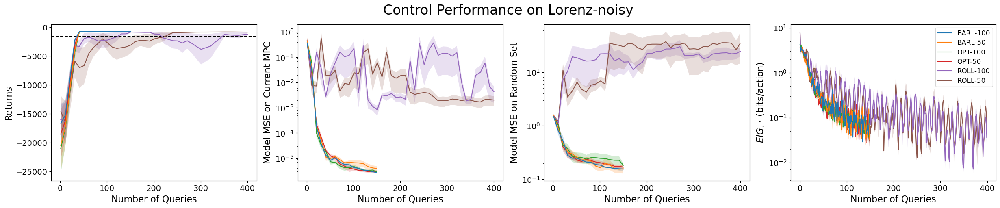

In [354]:
fig, [ax1, ax2, ax3, ax4] = plt.subplots(1, 4, figsize=(30, 5))
min_ndata = np.inf
normalize_information = True
for i, (key, vals) in enumerate(data.items()):
    rmean = vals["Eval Mean Returns"]
    rstderr = vals["Eval Std Returns"]
    ndata = vals['Eval ndata']
    if max(ndata)  < min_ndata:
        min_ndata =   max(ndata)
    ax1.plot(ndata[:len(rmean)], rmean, label=key, zorder=100 - i)
    ax1.fill_between(ndata[:len(rmean)], rmean - rstderr, rmean + rstderr, alpha=0.2)
#     ylim_top = (gt_val - bottom_val) * 0.25 + gt_val
#     ax1.set_ylim(bottom_val, ylim_top)
    if 'Model MSE' in vals:
        mses = vals['Model MSE']
        ax2.plot(ndata[:len(mses)], mses, label=key)
    elif 'Model MSE (current MPC)' in vals:
        mses = vals['Model MSE (current MPC)']
        ax2.plot(ndata[:len(mses)], mses, label=key)
    elif 'Model MSE (current real MPC)' in vals:
        mses = vals['Model MSE (current real MPC)']
        ax2.plot(ndata[:len(mses)], mses, label=key)
    elif "Mean MPC MSEs" in vals:
        mses = vals["Mean MPC MSEs"]
        stds = vals["Std MPC MSEs"]
        ax2.plot(ndata[:len(mses)], mses, label=key, zorder=100-i)
        ax2.fill_between(ndata[:len(mses)], mses - stds, mses + stds, alpha=0.2)
    else:
        print(f"No MPC MSE for {key}")
    if 'Model MSE (random test set)' in vals:
        mses = vals['Model MSE (random test set)']
        ax3.plot(ndata[:len(mses)], mses, label=key)
    elif "Mean Random MSEs" in vals:
        mses = vals["Mean Random MSEs"]
        stds = vals["Std Random MSEs"]
        ax3.plot(ndata[:len(mses)], mses, label=key, zorder=100-i)
        ax3.fill_between(ndata[:len(mses)], mses - stds, mses + stds, alpha=0.2)
    else:
        print(f"No Random MSE for {key}")
    if 'Acquisition Function Value' in vals:
        acqs = vals['Acquisition Function Value']
        if normalize_information and key in rollout_methods:
            acqs /= eig_horizon
        ax4.plot(acqs, label=key)
    elif "Mean Acq Fn Val" in vals:
        acqvals = vals['Mean Acq Fn Val']
        if normalize_information and key in rollout_methods:
            acqvals /= eig_horizon
        stds = vals['Std Acq Fn Val']
        if normalize_information and key in rollout_methods:
            stds /= eig_horizon
        idx = np.arange(len(acqvals))
        ax4.plot(idx, acqvals, label=key, zorder=100-i)
        ax4.fill_between(idx, acqvals - stds, acqvals + stds, alpha=0.2)
    else:
        ax4.plot([], label=key)

crop_to_min_data = False
if crop_to_min_data:
    for ax in [ax1, ax2, ax3, ax4]:
        ax.set_xlim(0, min_ndata)
        
ax1.set_xlabel('Number of Queries', fontsize=16)
ax1.set_ylabel('Returns', fontsize=16)
ax1.axhline(gt_val, color='black', linestyle='--', label=r'$\pi_T$')
ax4.legend(prop={"size": 12}, facecolor="white").set_zorder(101)
ax2.set_xlabel('Number of Queries', fontsize=16)
ax2.set_ylabel('Model MSE on Current MPC', fontsize=16)
ax3.set_ylabel("Model MSE on Random Set", fontsize=16)
ax3.set_xlabel('Number of Queries', fontsize=16)
ax4.set_xlabel('Number of Queries', fontsize=16)
if normalize_information:
    label = r'$EIG_{\tau^*}$ (bits/action)'
else:
    label = r'$EIG_{\tau^*}$'
ax4.set_ylabel(label, fontsize=16)
if env_name == 'Lava Path':
    ax1.set_ylim(-1000, 0)
ax2.set_yscale('log')
ax3.set_yscale('log')
ax4.set_yscale('log')
#ax1.set_xscale('log')

fig.suptitle(f"Control Performance on {env_name}", fontsize=24)
# neatplot.save_figure(f"{save_path}all_{env_name}", ["png", "pdf"])
plt.show()

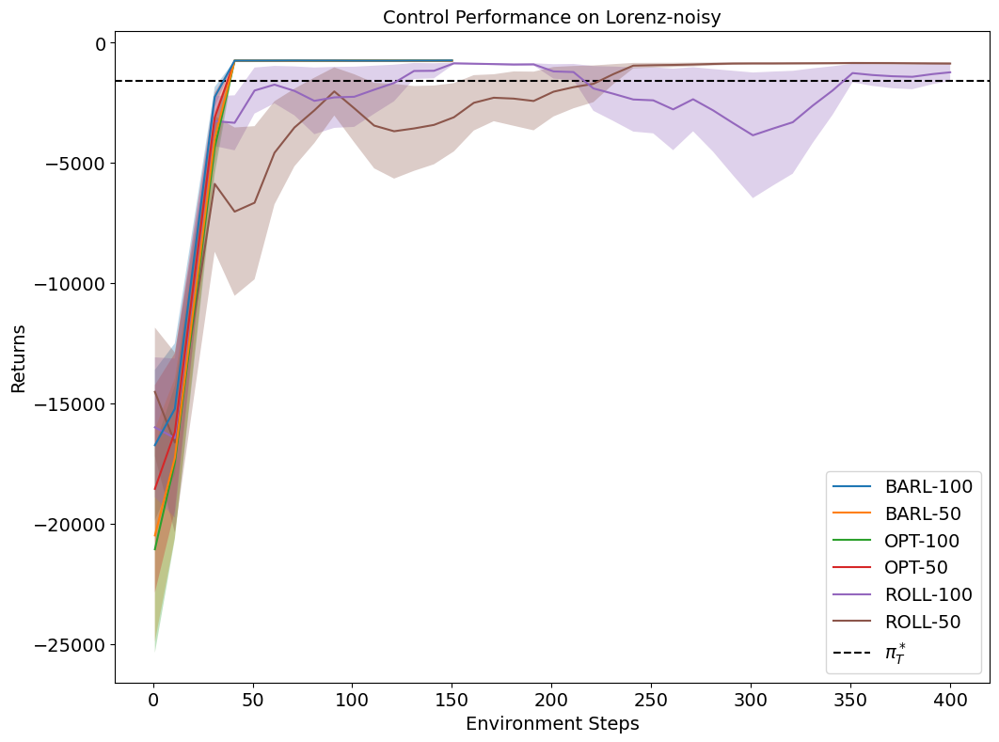

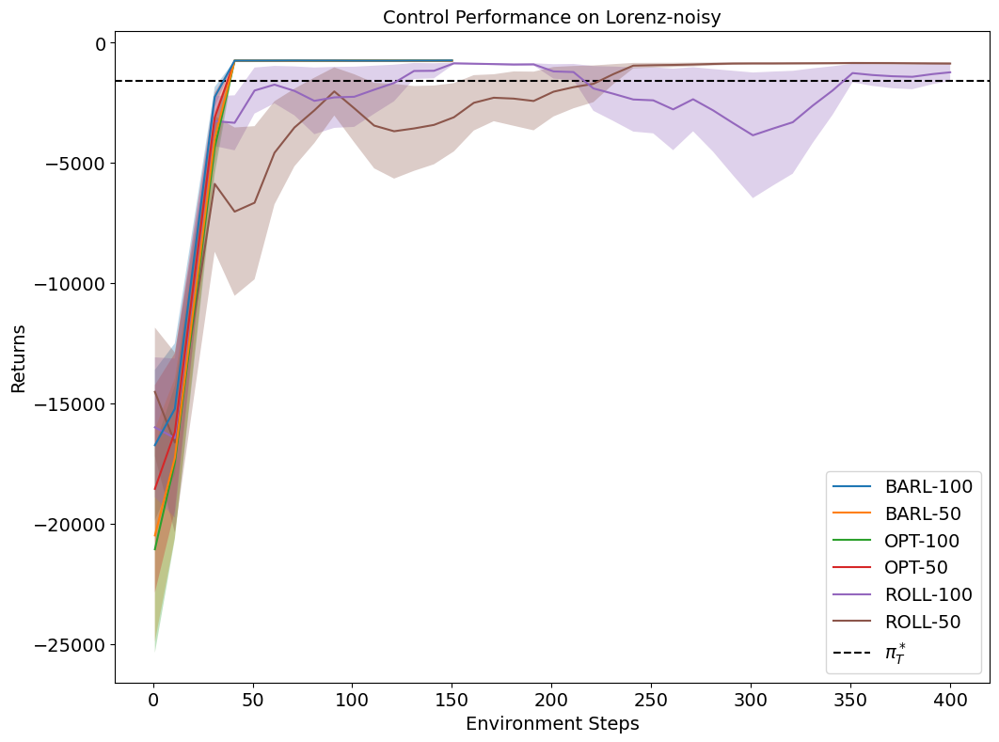

In [356]:
fig, ax = plt.subplots(figsize=(12, 9))
for i, (key, vals) in enumerate(data.items()):
#     if 'small' in key: continue
    rmean = vals["Eval Mean Returns"]
    rstderr = vals["Eval Std Returns"]
    ndata = vals['Eval ndata'][:len(rmean)]
    ax.plot(ndata, rmean, label=key, zorder=100 - i)
    ax.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
ax.set_xlabel('Environment Steps')
ax.set_ylabel('Returns')
ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi^*_T$')
ax.legend()
# ylim_top = (gt_val - bottom_val) * 0.25 + gt_val
# ax.set_ylim(bottom_val, ylim_top)
# ax.set_xscale('log')
# ax.set_ylim(-900, -100)
# ax.set_ylim(-1500, -100)

title = f"Control Performance on {env_name}"
ax.set_title(label=title, fontdict={'fontsize': 14})
# fig.suptitle()

plt.savefig(f'{save_path}sample_complexity_{env_name}.png', bbox_inches='tight')
plt.show()

In [357]:
def control_performance_plots(data, ymean, ystd, ylabel, 
                              x='Eval ndata', xlabel='Environment Steps', 
                              baseline=False, save=False, log=True,
                              mean_fn=None, std_fn=None):
    
    if len(data) < 1: return
    
    unq_samples = list(sorted(set(map(lambda x: int(x.split('-')[-1]), data.keys())), reverse=True))
    fig, ax = plt.subplots(1, len(unq_samples), figsize=(12, 5), sharey=True, sharex=True)
    if len(unq_samples) <= 1: ax = [ax]
    for i, (key, vals) in enumerate(data.items()):
        rmean = vals[ymean]
        rstderr = vals[ystd]
        if x: ndata = vals[x][:len(rmean)]
        else: ndata = ndata = np.arange(len(rmean))
        
        if mean_fn: rmean = mean_fn(rmean, gt_val)
        if std_fn: rstderr = std_fn(rmean, rstderr)
        
        samples = int(key.split('-')[-1])
        index = unq_samples.index(samples)
#         index = key.count('0') - 1
#         if '-1000' in key: index = 0
#         elif '-100' in key: index = 1
#         elif '-50' in key: index = 2
#         else: index = 3
        
        ax[index].plot(ndata, rmean, label=key, zorder=100 - i)
        ax[index].fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
    fig.supxlabel(xlabel)
    fig.supylabel(ylabel)
    for i in range(len(unq_samples)): 
        if baseline: ax[i].axhline(gt_val, color='black', linestyle='--', label=r'$\pi^*_T$')
        if log: ax[i].set_xscale('log')
#         ax[i].set_ylim(-1200, -100)
        ax[i].legend()

    title = f"Control Performance based on sample size on {env_name}"
    fig.suptitle(title)
    if save: plt.savefig(f'{save_path}Control_{ylabel}_a_{env_name}.png', bbox_inches='tight')
    plt.show()

    unq_algs = list(set(map(lambda x: "-".join(x.split('-')[:-1]), data.keys())))
    print(unq_algs)
    fig, ax = plt.subplots(1, len(unq_algs), figsize=(12, 5), sharey=True, sharex=True)
    if len(unq_algs) <= 1: ax = [ax]
    for i, (key, vals) in enumerate(data.items()):
#         if 'OPT' in key: index = 1
#         elif 'ROLL' in key: index = 2
#         else: index = 0
        algs = "-".join(key.split('-')[:-1])
        index = unq_algs.index(algs)
        
        rmean = vals[ymean]
        rstderr = vals[ystd]
        if x: ndata = vals[x][:len(rmean)]
        else: ndata = ndata = np.arange(len(rmean))
        
        if mean_fn: rmean = mean_fn(rmean, gt_val)
        if std_fn: rstderr = std_fn(rmean, rstderr)

        ax[index].plot(ndata, rmean, label=key, zorder=100 - i)
        ax[index].fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
    fig.supxlabel(xlabel)
    fig.supylabel(ylabel)
    for i in range(len(unq_algs)): 
        if baseline: ax[i].axhline(gt_val, color='black', linestyle='--', label=r'$\pi^*_T$')
        if log: ax[i].set_xscale('log')
#         ax[i].set_ylim(-1200, -100)
        ax[i].legend()

    title = f"Sample Size Impact on {env_name}"
    fig.suptitle(title)
    if save: plt.savefig(f'{save_path}Control_{ylabel}_b_{env_name}.png', bbox_inches='tight')
    plt.show()

In [358]:
# n_sub_data = {key:val for key,val in data.items() if 'SHORT' not in key}
# control_performance_plots(n_sub_data, 
#                           ymean='Eval Mean Returns', ystd="Eval Std Returns", ylabel='Returns', 
#                           baseline=True, save=True)

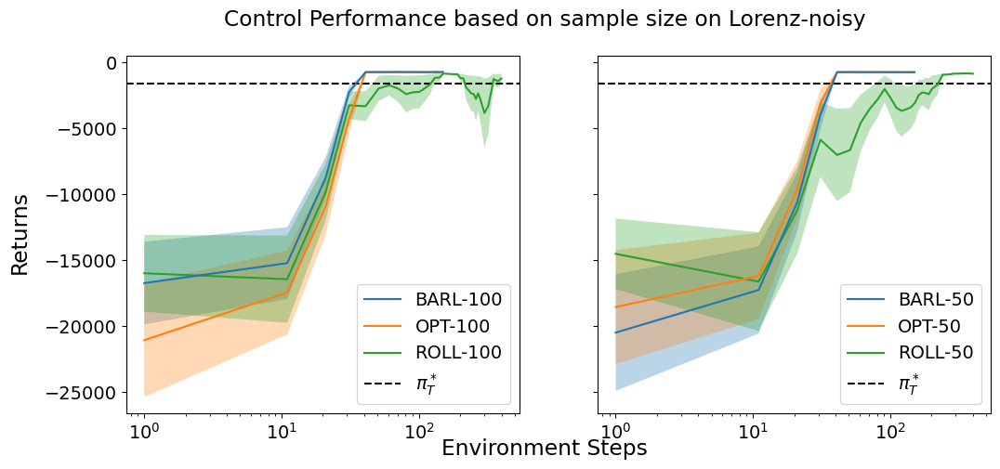

['ROLL', 'OPT', 'BARL']


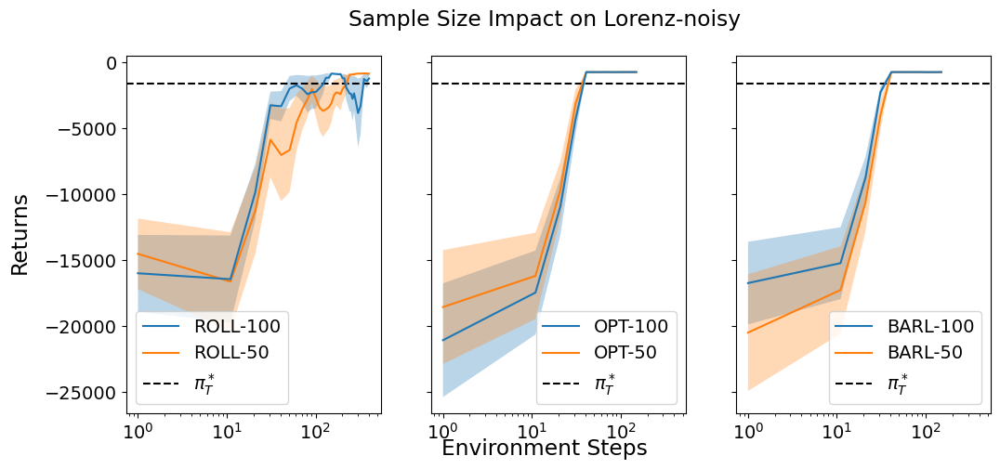

In [359]:
sub_data = {key:val for key,val in data.items()}# if 'SHORT' in key}
control_performance_plots(sub_data, 
                          ymean='Eval Mean Returns', ystd="Eval Std Returns", ylabel='Returns', 
                          baseline=True, save=True)

In [360]:
custom_print(f"Sample complexity of algorithms on {env_name}", 'sample_complexity')
for key, vals in data.items():
    print()
    if 'Eval Seed Returns' in vals:
        samps = []
        for row in vals['Eval Seed Returns']:
            try:
                sample_idx = np.where(row > gt_val)[0].min()
                samps.append(vals['Eval ndata'][sample_idx])
            except ValueError:
                samps.append(np.inf)
        custom_print(f"{key}: {sorted(samps)}", 'sample_complexity')
        mean = np.mean(samps)
        stderr = np.std(samps) / np.sqrt(5)
        custom_print(f"{mean=}, {stderr=}", 'sample_complexity')
        if max(samps) == np.inf:
            ndata = vals['Eval ndata']
            custom_print(f"{max(ndata)=}", 'sample_complexity')
        continue
    rmean = vals["Eval Mean Returns"]
    try:
        sample_idx = np.where(rmean > gt_val)[0].min()
        sample_complexity = vals['Eval ndata'][sample_idx]
    except ValueError:
        sample_complexity = None
    
    custom_print(f"{key}: {sample_complexity}", 'sample_complexity')

Sample complexity of algorithms on Lorenz-noisy

BARL-100: [11.0, 21.0, 21.0, 21.0]
mean=18.5, stderr=1.9364916731037085

BARL-50: [21.0, 21.0, 21.0, 21.0]
mean=21.0, stderr=0.0

OPT-100: [11.0, 21.0, 21.0, 21.0]
mean=18.5, stderr=1.9364916731037085

OPT-50: [11.0, 21.0, 21.0, 21.0]
mean=18.5, stderr=1.9364916731037085

ROLL-100: [11.0, 11.0, 21.0, 31.0]
mean=18.5, stderr=3.7080992435478315

ROLL-50: [11.0, 11.0, 11.0, 21.0]
mean=13.5, stderr=1.9364916731037085


In [361]:
# sub_data = {key:vals for key,vals in data.items() if (key == 'BARL-100') or (key == 'OPT-BARL-50')}

# fig, ax = plt.subplots(figsize=(12, 6))
# for i, (key, vals) in enumerate(sub_data.items()):
#     rmean = vals['Eval Mean Returns']
#     rstderr = vals['Eval Std Returns']
#     ndata = vals['Eval ndata'][:len(rmean)]
    
#     ax.plot(ndata, rmean, label=key, zorder=100 - i)
#     ax.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
# fig.supxlabel('Returns')
# fig.supylabel('Environment Steps')
# ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi_T$')
# ax.set_xscale('log')
# ax.legend()
# plt.show()

In [362]:
simple_regret = lambda mean, baseline: baseline - mean
# fig, ax = plt.subplots(figsize=(12, 9))
# for i, (key, vals) in enumerate(data.items()):
#     if key == 'TIP': continue
#     rmean = simple_regret(vals['Eval Mean Returns'], gt_val)
#     rstderr = vals["Eval Std Returns"]
#     ndata = vals['Eval ndata'][:len(rmean)]
#     ax.plot(ndata, rmean, label=key, zorder=100 - i)
#     ax.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
# ax.set_xlabel('Environment Steps')
# ax.set_ylabel('Simple Regret')
# # ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi_T$')
# # ax.legend()
# ylim_top = (gt_val - bottom_val) * 0.25 + gt_val
# # ax.set_ylim(bottom_val + gt_val, (gt_val - bottom_val) * 0.25)
# ax.set_xscale('log')
# # ax.set_yscale('log')
# # ax.set_xlim(0, 200)
# # ax.set_ylim(-10000, 0)
# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.6, box.height])

# # Put a legend to the right of the current axis
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2, fancybox=True)

# title = f"Control Performance on {env_name}"
# ax.set_title(label=title, fontdict={'fontsize': 14})

# # ax.set_ylim(-1, 20)

# # plt.savefig(f'{save_path}regret_{env_name}.png', bbox_inches='tight')
# plt.show()

In [363]:
avg_regret = lambda mean, base: np.cumsum(simple_regret(mean, base)) / np.arange(1, len(mean) + 1)
avg_regret_std = lambda mean, std: np.sqrt(np.cumsum(np.square(std))) / np.arange(1, len(mean) + 1)
# fig, ax = plt.subplots(figsize=(12, 9))
# for i, (key, vals) in enumerate(data.items()):
#     if key == 'TIP': continue
#     rmean = gt_val - vals["Eval Mean Returns"]
#     rstderr = vals["Eval Std Returns"]
#     ndata = vals['Eval ndata'][:len(rmean)]
# #     cum_mean = np.cumsum(rmean) / np.arange(1, len(rmean) + 1)
# #     cum_stderr = np.sqrt(np.cumsum(np.square(rstderr))) / np.arange(1, len(rmean) + 1)
#     cum_mean = avg_regret(vals["Eval Mean Returns"], gt_val)
#     cum_stderr = avg_regret_std(vals["Eval Mean Returns"], vals["Eval Std Returns"])
    
#     ax.plot(ndata, cum_mean, label=key, zorder=100 - i)
#     ax.fill_between(ndata, cum_mean - cum_stderr, cum_mean + cum_stderr, alpha=0.3)
# ax.set_xlabel('Environment Steps')
# ax.set_ylabel('Average Regret')
# # ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi_T$')
# # ax.legend()
# # ylim_top = (gt_val - bottom_val) * 0.25 + gt_val
# # ax.set_ylim(bottom_val + gt_val, (gt_val - bottom_val) * 0.25)
# ax.set_xscale('log')
# # ax.set_yscale('log')
# # ax.set_xlim(0, 200)

# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.6, box.height])

# # Put a legend to the right of the current axis
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2, fancybox=True)

# title = f"Control Performance on {env_name}"
# ax.set_title(label=title, fontdict={'fontsize': 14})

# # plt.savefig(f'{save_path}average_regret_{env_name}.png', bbox_inches='tight')
# plt.show()


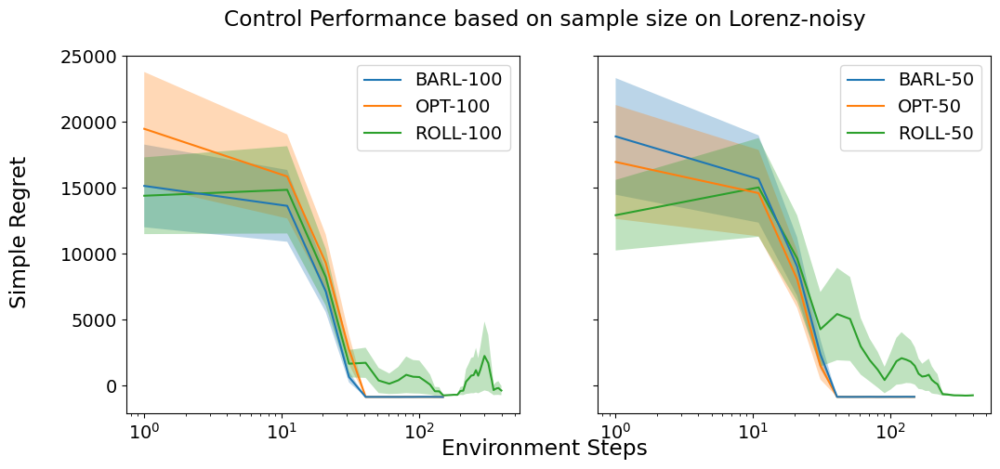

['ROLL', 'OPT', 'BARL']


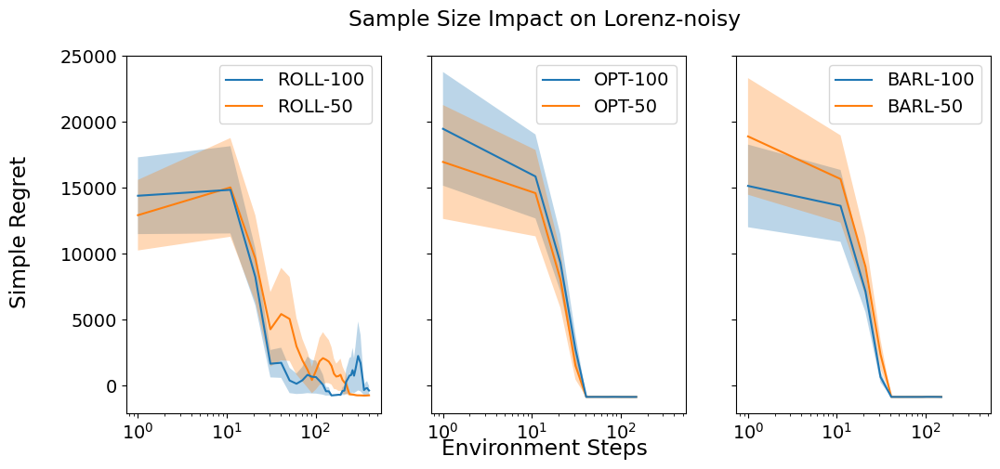

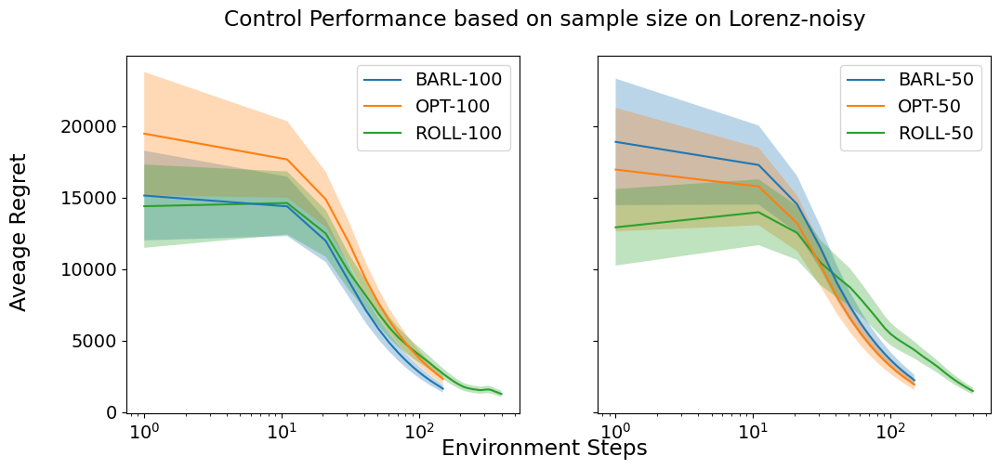

['ROLL', 'OPT', 'BARL']


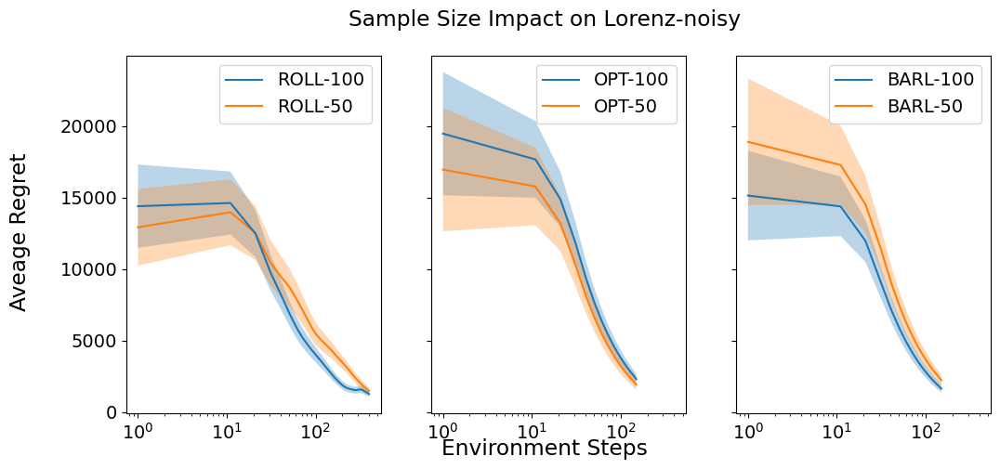

In [364]:
control_performance_plots(sub_data, ymean='Eval Mean Returns', ystd="Eval Std Returns", ylabel='Simple Regret', mean_fn=simple_regret, save=True)
control_performance_plots(sub_data, ymean='Eval Mean Returns', ystd='Eval Std Returns', ylabel='Aveage Regret', mean_fn=avg_regret, std_fn=avg_regret_std, save=True)

In [365]:
# fig, ax = plt.subplots(figsize=(12, 9))
# for i, (key, vals) in enumerate(data.items()):
#     if 'Acquisition Function Value' in vals:
#         acqs = vals['Acquisition Function Value']
#         if normalize_information and key in rollout_methods:
#             acqs /= eig_horizon
#         plt.plot(acqs, label=key)
#     elif "Mean Acq Fn Val" in vals:
#         acqvals = vals['Mean Acq Fn Val']
#         if normalize_information and key in rollout_methods:
#             acqvals /= eig_horizon
#             print('norm')
#         stds = vals['Std Acq Fn Val']
#         if normalize_information and key in rollout_methods:
#             stds /= eig_horizon
#         idx = np.arange(len(acqvals))
#         plt.plot(idx, acqvals, label=key, zorder=100-i)
#         plt.fill_between(idx, acqvals - stds, acqvals + stds, alpha=0.2)
#     else:
#         plt.plot([], label=key)
# ax.set_xlabel('Environment Steps')
# ax.set_ylabel('EIG')
# ax.set_xscale('log')

# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.6, box.height])

# # Put a legend to the right of the current axis
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2, fancybox=True)

# title = f"Control Performance on {env_name}"
# ax.set_title(label=title, fontdict={'fontsize': 14})

# # plt.savefig(f'{save_path}average_eig_{env_name}.png', bbox_inches='tight')
# plt.show()

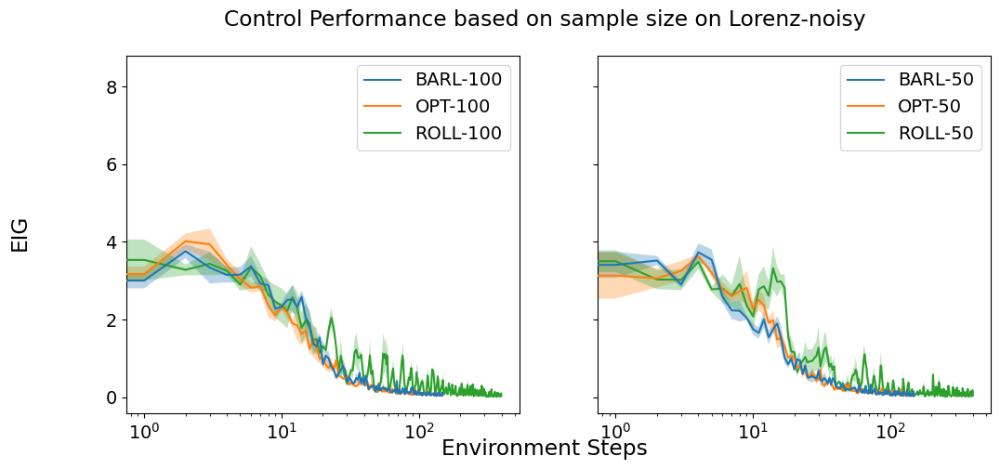

['ROLL', 'OPT', 'BARL']


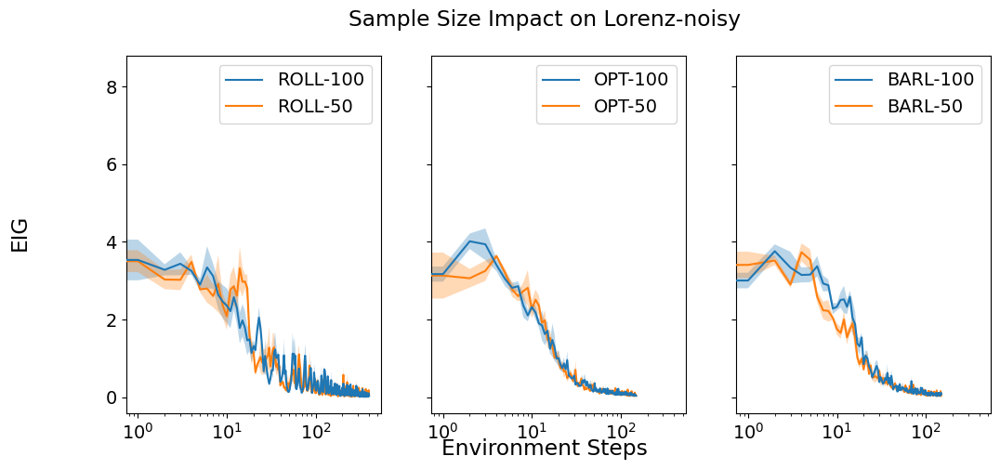

In [366]:
control_performance_plots(sub_data, ymean='Mean Acq Fn Val', ystd='Std Acq Fn Val', 
                          ylabel='EIG', log=True, x=None, save=True)

### Sampling Evaluation

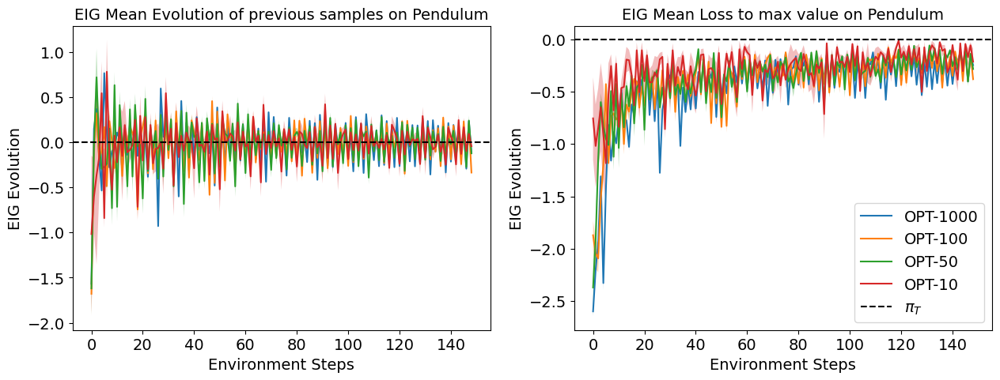

In [23]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(15, 5))
for i, (key, vals) in enumerate(data.items()):
    if 'OPT' not in key: continue
    rmean = vals["EIG Mean Evolution"]
    rstderr = vals["EIG Std Evolution"]
    ndata = list(range(len(rmean)))
    ax1.plot(ndata, rmean, label=key)
    ax1.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
    
    rmean = vals['EIG Mean Loss to Max']
    rstderr = vals['EIG Std Loss to Max']
    ndata = list(range(len(rmean)))
    ax2.plot(ndata, rmean, label=key)
    ax2.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)

title = f"EIG Mean Evolution of previous samples on {env_name}"
ax1.set_title(label=title, fontdict={'fontsize': 14})
ax1.set_xlabel('Environment Steps')
ax1.set_ylabel('EIG Evolution')
ax1.axhline(0, color='black', linestyle='--', label=r'$\pi_T$')
# ax1.set_xscale('log')

title = f"EIG Mean Loss to max value on {env_name}"
ax2.set_title(label=title, fontdict={'fontsize': 14})
ax2.set_xlabel('Environment Steps')
ax2.set_ylabel('EIG Evolution')
ax2.axhline(0, color='black', linestyle='--', label=r'$\pi_T$')
# ax2.set_xscale('log')

plt.legend()
plt.savefig(f'{save_path}eig_evolution_{env_name}.png', bbox_inches='tight')
plt.show()

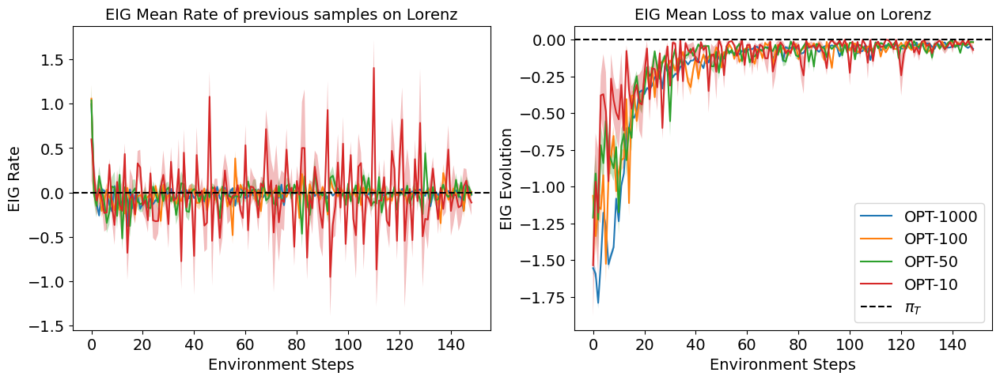

In [39]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(15, 5))
for i, (key, vals) in enumerate(data.items()):
    if 'OPT' not in key: continue
    rmean = vals["EIG Mean Rate"]
    rstderr = vals["EIG Std Rate"]
    ndata = list(range(len(rmean)))
    ax1.plot(ndata, rmean, label=key)
    ax1.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
    
    rmean = vals['EIG Mean Loss to Max']
    rstderr = vals['EIG Std Loss to Max']
    ndata = list(range(len(rmean)))
    ax2.plot(ndata, rmean, label=key)
    ax2.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)

title = f"EIG Mean Rate of previous samples on {env_name}"
ax1.set_title(label=title, fontdict={'fontsize': 14})
ax1.set_xlabel('Environment Steps')
ax1.set_ylabel('EIG Rate')
ax1.axhline(0, color='black', linestyle='--', label=r'$\pi_T$')
# ax1.set_xscale('log')

title = f"EIG Mean Loss to max value on {env_name}"
ax2.set_title(label=title, fontdict={'fontsize': 14})
ax2.set_xlabel('Environment Steps')
ax2.set_ylabel('EIG Evolution')
ax2.axhline(0, color='black', linestyle='--', label=r'$\pi_T$')
# ax2.set_xscale('log')

plt.legend()
plt.savefig(f'{save_path}eig_rate_{env_name}.png', bbox_inches='tight')
plt.show()

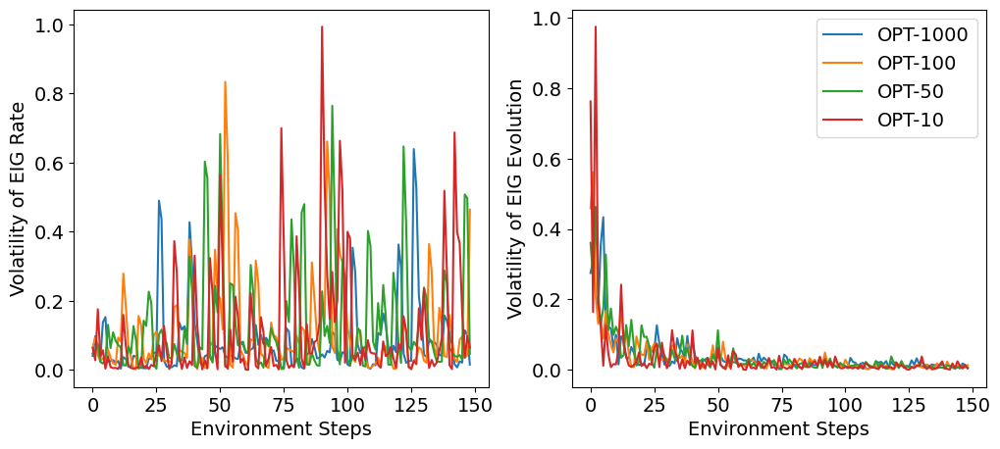

In [25]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=False)
for i, (key, vals) in enumerate(data.items()):
    if 'OPT' not in key: continue
        
    rmean = vals["Volatility of Rate"]
    ndata = list(range(len(rmean)))
    ax1.plot(ndata, rmean, label=key)
    ax1.set_xlabel('Environment Steps')
    ax1.set_ylabel('Volatility of EIG Rate')
    
    rmean = vals["Volatility of Evolution"]
    ax2.plot(ndata, rmean, label=key)
    ax2.set_xlabel('Environment Steps')
    ax2.set_ylabel('Volatility of EIG Evolution')
plt.legend()
plt.savefig(f'{save_path}eig_volatility_{env_name}.png', bbox_inches='tight')
plt.show()

In [367]:
optimised = [nm for nm in data.keys() if ('OPT' in nm) ]
perc = []

for name in optimised:
    custom_print(f"Algorithm {name}:", 'sample_reuse')
    chose_old_sample = [[1 if any(iter) else 0 for iter in seed] for seed in data[name]['EIG Seed Loss to Max']==0]
    chose_old_sample = np.array(chose_old_sample)
    custom_print(f"\tAverage number of iters that used datapoints from the previous "\
          f"sampling {chose_old_sample.mean(axis=0).sum()} over {chose_old_sample.shape[0]} seeds", 'sample_reuse')
    custom_print(f"\tTotal iterations {chose_old_sample.shape[1]}", 'sample_reuse')
    custom_print(f"\tPercentage of iters that used datapoints from the previous "\
        f"sampling {chose_old_sample.mean()} over {chose_old_sample.shape[0]} seeds", 'sample_reuse')
    perc.append(chose_old_sample.mean())
np.array(perc).mean()

Algorithm OPT-100:
	Average number of iters that used datapoints from the previous sampling 75.75 over 4 seeds
	Total iterations 149
	Percentage of iters that used datapoints from the previous sampling 0.5083892617449665 over 4 seeds
Algorithm OPT-50:
	Average number of iters that used datapoints from the previous sampling 70.0 over 4 seeds
	Total iterations 149
	Percentage of iters that used datapoints from the previous sampling 0.4697986577181208 over 4 seeds


0.4890939597315436

In [42]:
# ndata = list(range(len(rmean)))
# rmean = chose_old_sample.mean(axis=0)
# rstderr = chose_old_sample.std(axis=0) / np.sqrt(len(ndata))

# fig, ax = plt.subplots(figsize=(12, 9))
# ax.plot(ndata, rmean, label='')
# ax.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)
# # ax.legend()
# title = f"Percentage of seeds that used datapoints from previous sampling on {env_name}"
# ax.set_title(label=title, fontdict={'fontsize': 14})
# ax.set_xlabel('Environment Steps')
# ax.set_ylabel(f'Percentage of points over {chose_old_sample.shape[0]} seeds')

# # plt.savefig(f'{save_path}prev_sample_usage_{env_name}.png', bbox_inches='tight')
# plt.show()

In [215]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

def outliers(data):
    Q1 = np.percentile(data, 25, method='midpoint')
    Q3 = np.percentile(data, 75, method='midpoint')
    IQR = Q3 - Q1
    upper = Q3 + 1.5*IQR
    lower = Q1 - 1.5*IQR
    return upper, lower

def correlation_graph(ax, key, vals, x, y, colored=None, features=5, 
                      absolutey=True, only_negative=False, 
                      outliers_x=False, outliers_y=False):
    x_values = vals[x].flatten()
    y_values = vals[y].flatten()
    try: c_values = vals[colored].flatten()
    except: c_values=None
        
    if only_negative: 
        x_values = np.array(list(x for x,y in zip(x_values,y_values) if y<0))
        if not (c_values is None): c_values = np.array(list(c for c,y in zip(c_values,y_values) if y<0))
        y_values = y_values[y_values<0]
    if absolutey: y_values = np.abs(y_values)
        
    if outliers_x:
        upper, lower = outliers(x_values)
        y_values = np.array(list(y for x,y in zip(x_values,y_values) if (x<upper) and (x>lower)))
        x_values = x_values[x_values<upper]
        x_values = x_values[x_values>lower]
    if outliers_y:
        upper, lower = outliers(y_values)
        x_values = np.array(list(x for x,y in zip(x_values,y_values) if (y<upper) and (y>lower)))
        y_values = y_values[y_values<upper]
        y_values = y_values[y_values>lower]
    
    model = make_pipeline(PolynomialFeatures(features), LinearRegression())
    model.fit(np.array(x_values).reshape(-1, 1), y_values)
    x_reg = np.arange(0, x_values.max(), .2)
    y_reg = model.predict(x_reg.reshape(-1, 1))
    model = make_pipeline(PolynomialFeatures(1), LinearRegression())
    model.fit(np.array(x_values).reshape(-1, 1), y_values)
    y_reg_l = model.predict(x_reg.reshape(-1, 1))
    
    graphic = ax.scatter(x_values, y_values, c=c_values)
    ax.axhline(0, color='k', linestyle='--', label="baseline: no change in value")
    ax.plot(x_reg, y_reg, 'r', label="Polynomial Regression")
    ax.plot(x_reg, y_reg_l, 'orange', label="Linear Regression")
    ax.legend(title="Correlation metrics:"\
           f"\nPearson Linear Correlation: {stats.pearsonr(y_values, x_values)[0]:.2f}"\
          f"\nSpearman Monotonicity: {stats.spearmanr(y_values, x_values)[0]:.2f}"\
          f"\nKendall Correspondence: {stats.kendalltau(y_values, x_values)[0]:.2f}",
             loc=1)
    ax.title.set_text(key)
    if colored: plt.colorbar(graphic, label=colored)
    
    return graphic

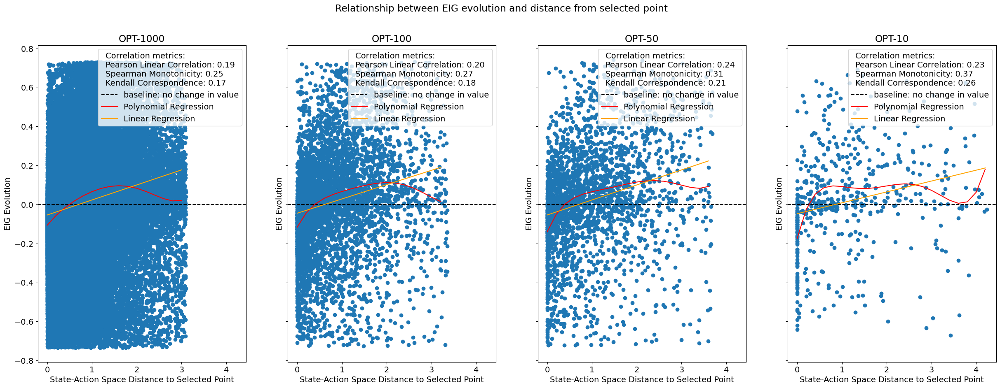

In [223]:
sub_data = {key:vals for key, vals in data.items() if 'OPT' in key}
fig, ax = plt.subplots(1, len(sub_data.keys()), figsize=(30,10), sharex=True,sharey=True)
for i, (key, vals) in enumerate(sub_data.items()):
    correlation_graph(ax[i], key, vals, 'Overall Distance Seed to Selected', 'EIG Seed Evolution', 
                      absolutey=False, outliers_x=True, outliers_y=True)
    ax[i].set_xlabel('State-Action Space Distance to Selected Point')
    ax[i].set_ylabel('EIG Evolution')

plt.suptitle("Relationship between EIG evolution and distance from selected point")
plt.savefig(f'{save_path}corr_stace_action_dist_{env_name}.png', format='png', bbox_inches='tight')
plt.show()

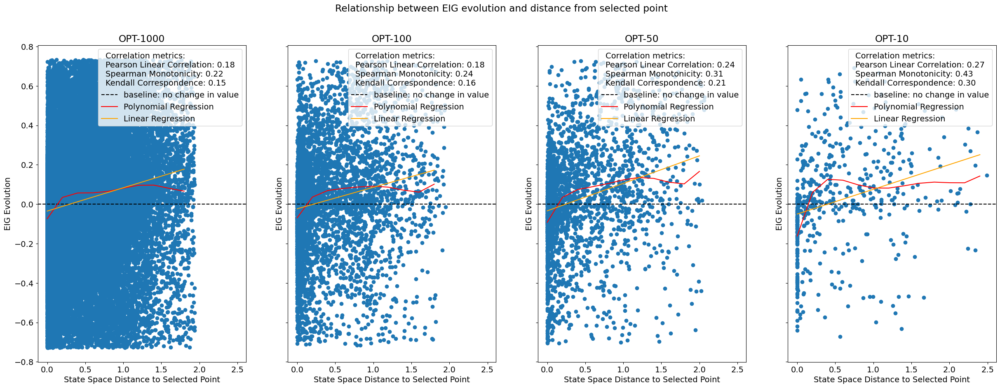

In [224]:
sub_data = {key:vals for key, vals in data.items() if 'OPT' in key}
fig, ax = plt.subplots(1, len(sub_data.keys()), figsize=(30,10), sharex=True, sharey=True)
for i, (key, vals) in enumerate(sub_data.items()):
    correlation_graph(ax[i], key, vals, 
                      x='State Distance Seed to Selected', 
                      y='EIG Seed Evolution', 
#                       colored='Action Distance Seed to Selected', 
                      absolutey=False,
                     outliers_x=True, outliers_y=True)
    ax[i].set_xlabel('State Space Distance to Selected Point')
    ax[i].set_ylabel('EIG Evolution')
    
plt.suptitle("Relationship between EIG evolution and distance from selected point")
plt.savefig(f'{save_path}corr_stace_dist_{env_name}.png', format='png', bbox_inches='tight')
plt.show()

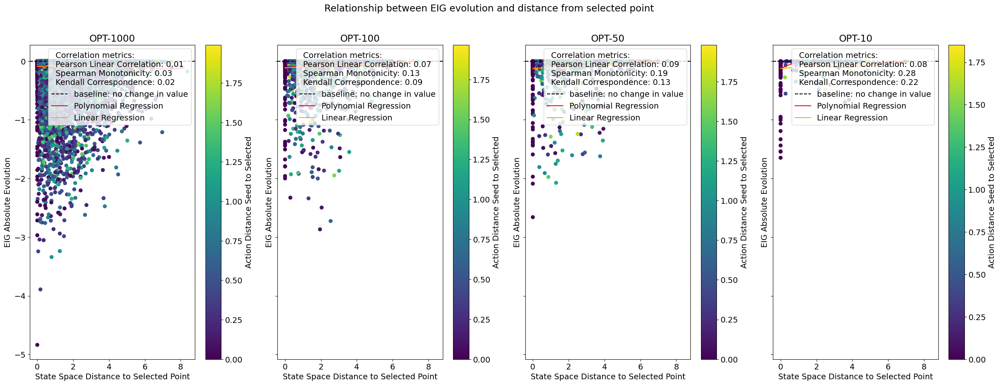

In [46]:
sub_data = {key:vals for key, vals in data.items() if 'OPT' in key}
fig, ax = plt.subplots(1, len(sub_data.keys()), figsize=(30,10), sharex=True, sharey=True)
for i, (key, vals) in enumerate(sub_data.items()):
    correlation_graph(ax[i], key, vals, 
                      x='State Distance Seed to Selected', 
                      y='EIG Seed Evolution', 
                      colored='Action Distance Seed to Selected', absolutey=False,
                      only_negative=True)
    ax[i].set_xlabel('State Space Distance to Selected Point')
    ax[i].set_ylabel('EIG Absolute Evolution')
    
plt.suptitle("Relationship between EIG evolution and distance from selected point")
# plt.savefig(f'{save_path}corr_space_dist_{env_name}.png', bbox_inches='tight')
plt.show()

- Distance is not very relevant to EIG evolution
- Concentration doesn't seem to be a problem
- Uncertainty probably controls the EIG evolution which is not very variant
- Maybe we have all the correct points from the beginning?
- -> Use the first sample and check
- The question is what makes a point relevant
- -> Investigate the unique features of the collected dataset

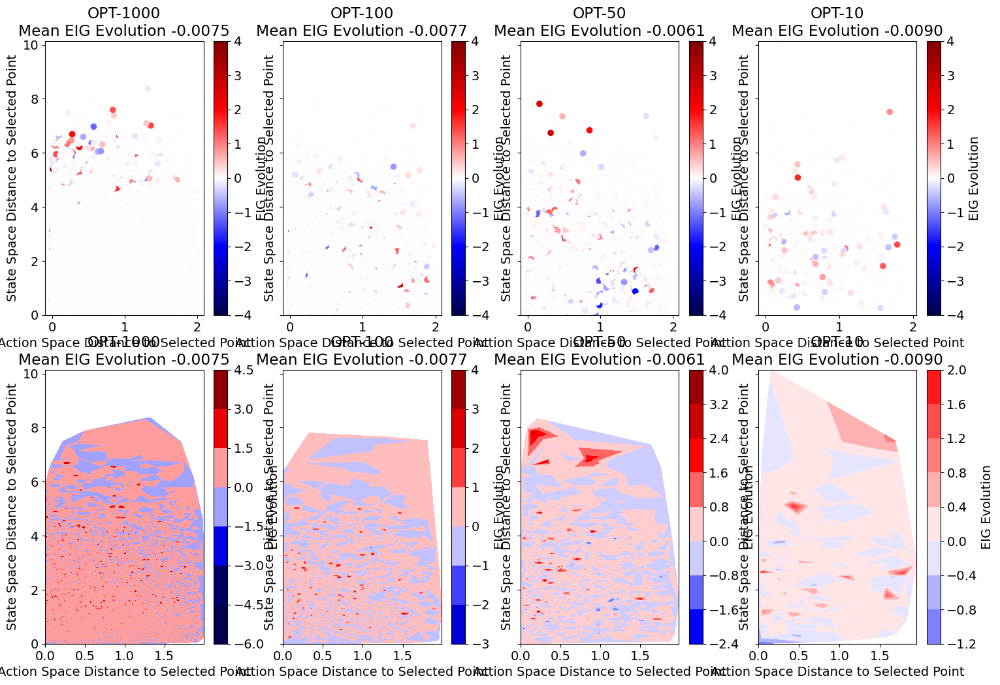

In [47]:
"""
x: action distance
y: state distance
color: eig evolution
"""
fig, ax = plt.subplots(2, len(optimised), figsize=(18, 12), sharey=True)
for i, name in enumerate(optimised):
    vals = data[name]
    eig_evolution = vals['EIG Seed Evolution'].flatten()
    state_dist = vals['State Distance Seed to Selected'].flatten()
    action_dist = vals['Action Distance Seed to Selected'].flatten()

#     print(f"Mean EIG Evolution {eig_evolution.mean()}")

    sctr = ax[0,i].scatter(action_dist, state_dist, c=eig_evolution, cmap='seismic', vmin=-4, vmax=4)
    plt.colorbar(sctr, label='EIG Evolution')
    sctr = ax[1,i].tricontourf(action_dist, state_dist, eig_evolution, cmap='seismic', vmin=-4, vmax=4)
    plt.colorbar(sctr, label='EIG Evolution')
# ax.set_xscale('log')
# ax.set_yscale('log')
    for j in range(2):
        ax[j,i].set_xlabel('Action Space Distance to Selected Point')
        ax[j,i].set_ylabel('State Space Distance to Selected Point')
        ax[j,i].title.set_text(f"{name}\nMean EIG Evolution {eig_evolution.mean():.4f}")

# plt.colorbar(sctr, label='EIG Evolution')
# plt.suptitle(name)
# plt.savefig(f'{save_path}corr_visual_space_action_dist_{env_name}.png', bbox_inches='tight')
plt.show()

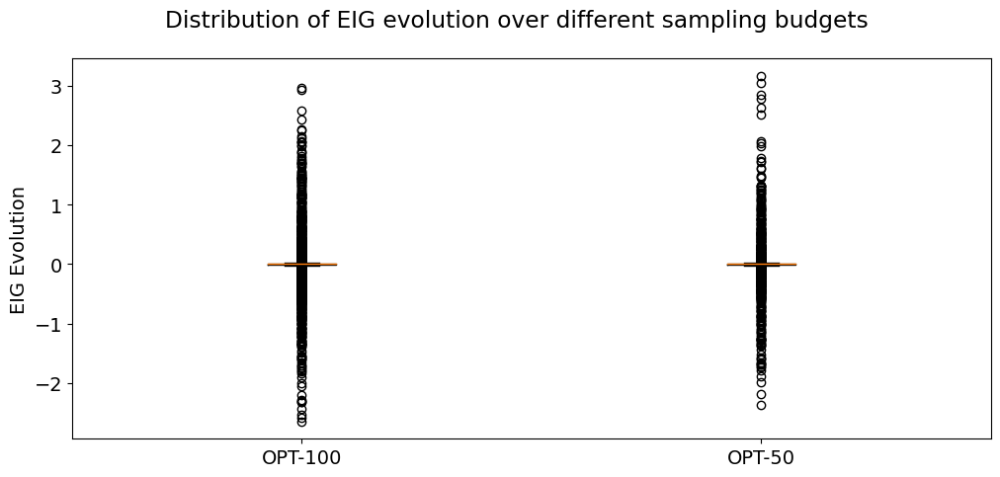

In [368]:
fig, ax = plt.subplots(figsize=(12, 5))
eig_evolution = []
for i, (key, vals) in enumerate(data.items()):
    if 'OPT' in key:
        eig_evolution.append(vals['EIG Seed Evolution'].flatten())

ax.boxplot(eig_evolution, labels=[key for key in data.keys() if 'OPT' in key])

plt.suptitle("Distribution of EIG evolution over different sampling budgets")
plt.ylabel("EIG Evolution")
plt.savefig(f'{save_path}distribution_eig_evolution_{env_name}.png', bbox_inches='tight')
plt.show()

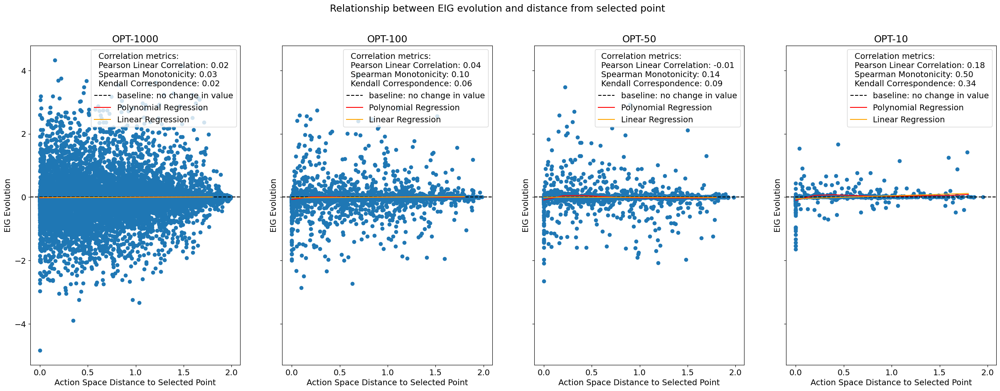

In [49]:
sub_data = {key:vals for key, vals in data.items() if 'OPT' in key}
fig, ax = plt.subplots(1, len(sub_data.keys()), figsize=(30,10), sharex=True, sharey=True)
for i, (key, vals) in enumerate(sub_data.items()):
    correlation_graph(ax[i], key, vals, 
                      x='Action Distance Seed to Selected', 
                      y='EIG Seed Evolution', absolutey=False)
    ax[i].set_xlabel('Action Space Distance to Selected Point')
    ax[i].set_ylabel('EIG Evolution')
    
plt.suptitle("Relationship between EIG evolution and distance from selected point")
# plt.savefig(f'{save_path}corr_action_dist_{env_name}.png', bbox_inches='tight')
plt.show()

### EIG Map

In [50]:
# print(data['BARL-100']['Old Samples'].shape) # (seeds, iters, samples, dimention)
# print(data['BARL-100']['Old EIG'].shape) # (seeds, iters, samples)
# print(data['BARL-100']['Old Samples'][0][0][:5]) # first 5 samples of seed 0
# print(data['BARL-100']['Old EIG'][0][0][:5])
# print(data['BARL-100']['New EIG'][0][0][:5])

In [369]:
from scipy.interpolate import LinearNDInterpolator

def EIG_MAP(exp_name, seed, iterations, s_dim=2, cartesian=False):
    # State Samples
    samples = data[exp_name]['Old Samples'][seed, iterations, :, :s_dim].reshape(-1, s_dim)
    print(samples.shape)
    x, y = samples[:, 0], samples[:, 1]
    
#     if radial:
#         y = np.cos(x) # np.cos(0)=1
#         x = np.sin(x) # np.sin(0)=0
    
    # EIG Values
    c = data[exp_name]['Old EIG'][seed, iterations].flatten()
    print(c.shape)


    interp = LinearNDInterpolator(list(zip(x, y)), c)
    X = np.linspace(min(x), max(x))
    Y = np.linspace(min(y), max(y))
    X, Y = np.meshgrid(X, Y, )
    C = interp(X, Y)
    
    # Observations Chosen
    obs_x = data[exp_name]['X Seed'][:,1:] # this is important because 
                                           # on the first iteration we 
                                           # do not have eig comparison !!!
    obs = obs_x[seed, iterations, :s_dim].reshape(-1, s_dim)
    print(obs.shape)
    obs_x, obs_y = obs[:,0], obs[:,1]
#     if radial:
#         obs_y = np.cos(obs_x) # np.cos(0)=1
#         obs_x = np.sin(obs_x) # np.sin(0)=0

    plt.figure()

    # plt.scatter(x, y, c=c)
    plt.pcolormesh(X, Y, C, shading='auto')
    # plt.plot(x, y, "ok", label="input point")

    plt.plot(obs_x, obs_y, "+r", markersize=10)
    
    if cartesian: x_label, y_label = r'$x$', r'$y$'
    else: x_label, y_label = r'angle $\theta$', r'velocity $v$'
    
    plt.title(r'$EIG_{\tau^*}$' + f' Map on {env_name}')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.colorbar(label=r'$EIG_{\tau^*}$')
    plt.savefig(f'{save_path}EIG_MAP_{env_name}.png', format='png', bbox_inches='tight')
    plt.show()

(1000, 2)
(1000,)
(10, 2)


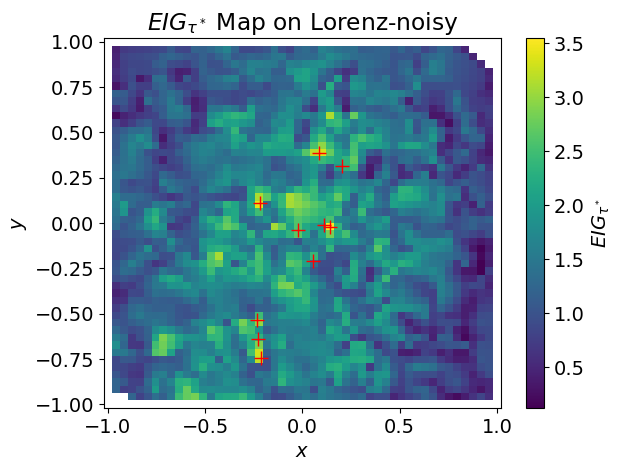

In [370]:
exp_name = 'BARL-100'
seed = 0
iterations = slice(0,10)

EIG_MAP(exp_name, seed, iterations, cartesian=True)

### Trajectories

#### Pendulum

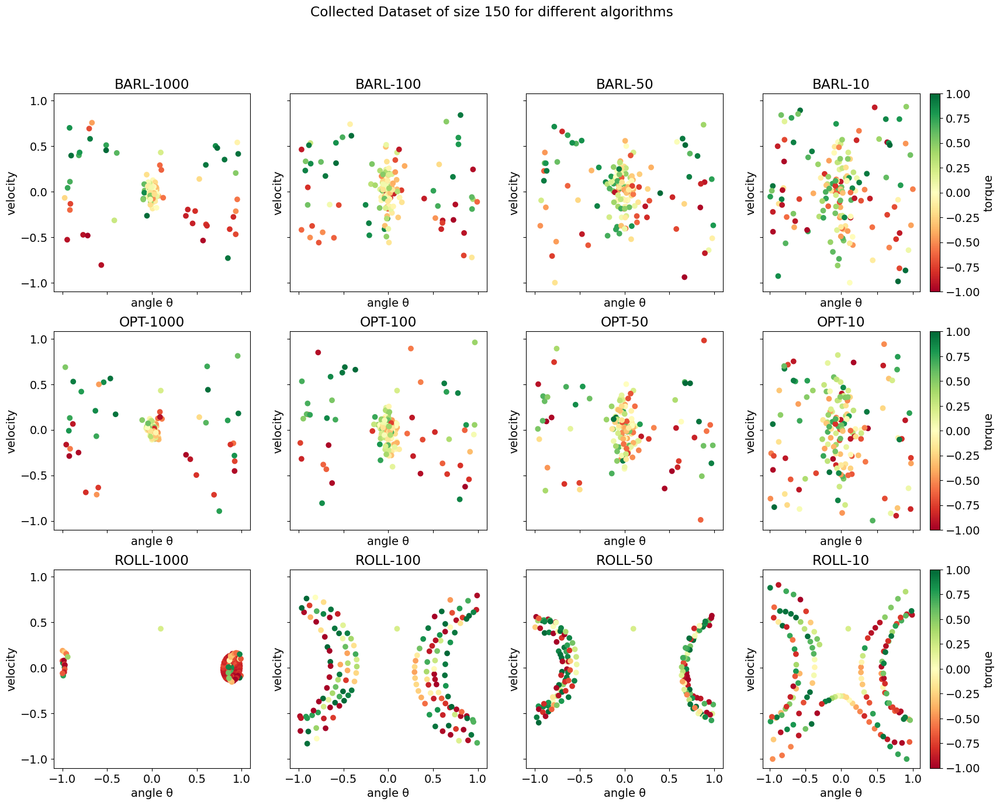

In [99]:
budget = 150
rows = 3 + len(data.keys())%3
cols = len(data.keys())//3
fig, ax = plt.subplots(rows, cols, figsize=(20, 15), sharex=True, sharey=True)
for index, (key, vals) in enumerate(data.items()):
    i = index//cols
    j = index%cols
    
    seed_0 = np.array(vals['X Seed'][0][:budget])
    plot = ax[i,j].scatter(seed_0[:,0], seed_0[:,1], c=seed_0[:,2], cmap='RdYlGn', vmin=-1, vmax=1)
    if j == cols-1: plt.colorbar(plot, ax=ax[i,j], label='torque')
    ax[i,j].title.set_text(key)
    ax[i,j].set_xlabel('angle θ')
    ax[i,j].set_ylabel('velocity')
    
# plt.colorbar(plot, label='action: torque')
plt.suptitle(f'Collected Dataset of size {budget} for different algorithms')

plt.savefig(f'{save_path}dataset_{budget}_{env_name}.png', bbox_inches='tight')
plt.show()

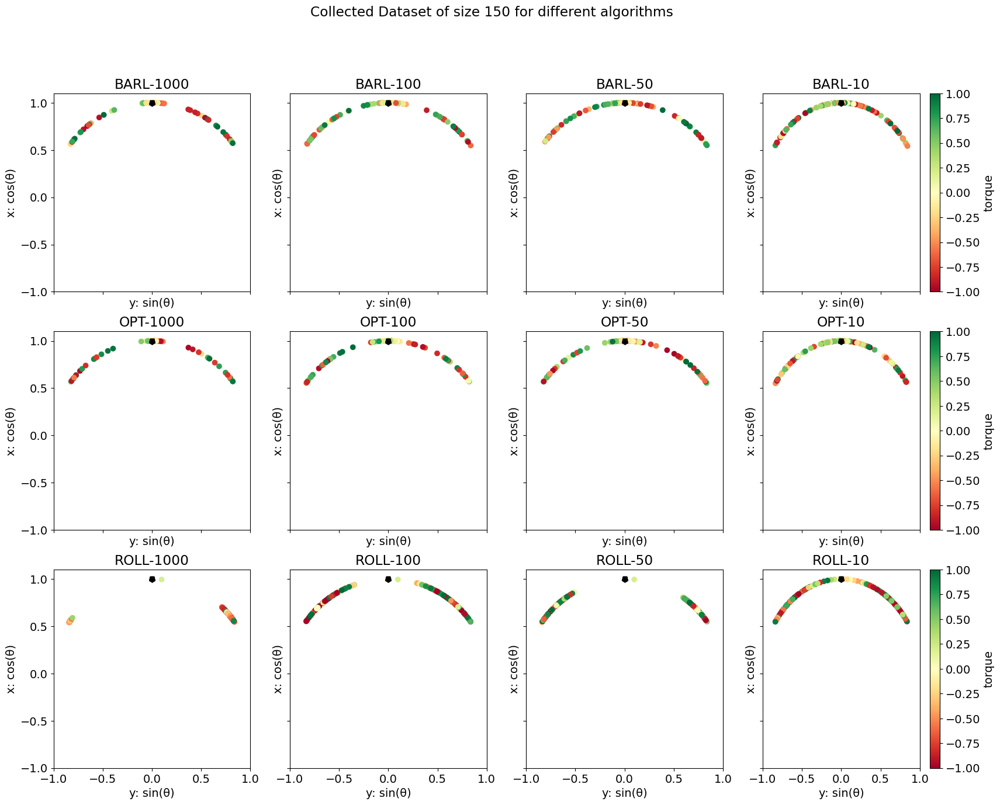

In [100]:
budget = 150
rows = 3 + len(data.keys())%3
cols = len(data.keys())//3
fig, ax = plt.subplots(rows, cols, figsize=(20, 15), sharex=True, sharey=True)
for index, (key, vals) in enumerate(data.items()):
    i = index//cols
    j = index%cols
    
    seed_0 = np.array(vals['X Seed'][0][:budget])
    theta = seed_0[:,0]
    velocity = seed_0[:,1]
    torque = seed_0[:,2]
    x = np.cos(theta) # np.cos(0)=1
    y = np.sin(theta) # np.sin(0)=0
    plot = ax[i,j].scatter(y, x, c=torque, cmap='RdYlGn', vmin=-1, vmax=1)
    if j == cols-1: plt.colorbar(plot, ax=ax[i,j], label='torque')
    ax[i,j].title.set_text(key)
    ax[i,j].set_ylabel('x: cos(θ)')
    ax[i,j].set_xlabel('y: sin(θ)')
    ax[i,j].set_ylim(-1,1.1)
    ax[i,j].set_xlim(-1,1)
    ax[i,j].plot(0, 1, '*k', mew=5)

# plt.colorbar(plot, label='action: torque')
plt.suptitle(f'Collected Dataset of size {budget} for different algorithms')

# plt.savefig(f'{save_path}dataset_{budget}_{env_name}.png', bbox_inches='tight')
plt.show()

In [65]:
def testing(vals, seed_number=1):
    seed_0 = np.array(vals['GT Paths'][seed_number][0].x)
    theta = seed_0[:, 0]
    velocity = seed_0[:, 1]
    
    time = np.arange(len(theta))
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    ax.plot(time, theta, label=r'$\theta$')
    ax.plot(time, velocity, label=r'$v$')
#     ax.plot(time, z, label='$z$')
#     ax.plot(time, actions[:,0], label='$u_1$')
#     ax.plot(time, actions[:,1], label='$u_2$')
#     ax.plot(time, actions[:,2], label='$u_3$')
    
    ax.set_xlabel('$t$')
    ax.set_ylabel(r'$\tau^*$')
    ax.legend(loc=1)
    
    plt.suptitle(rf'Optimal trajectory $\tau^*$')

    # plt.savefig(f'{save_path}optimal_paths_{env_name}.png', bbox_inches='tight')
    plt.show()

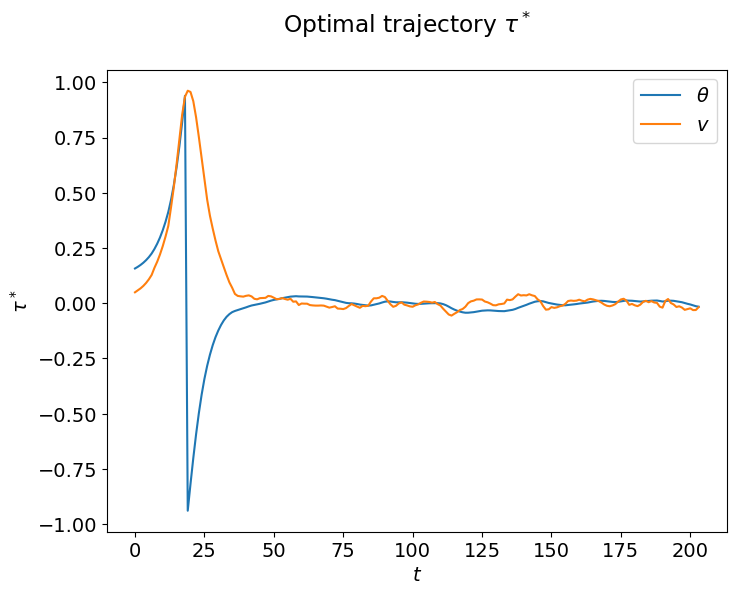

In [67]:
testing(extra, 1)

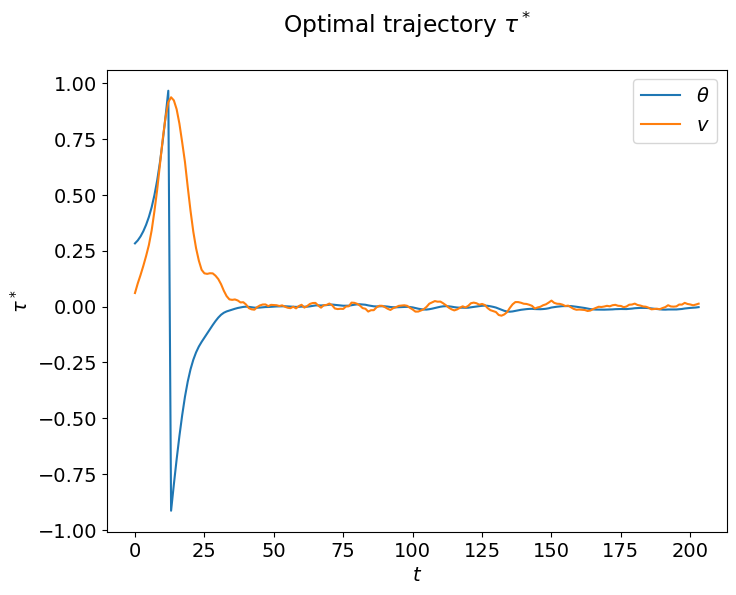

In [69]:
testing(extra, 3)

#### Lorenz

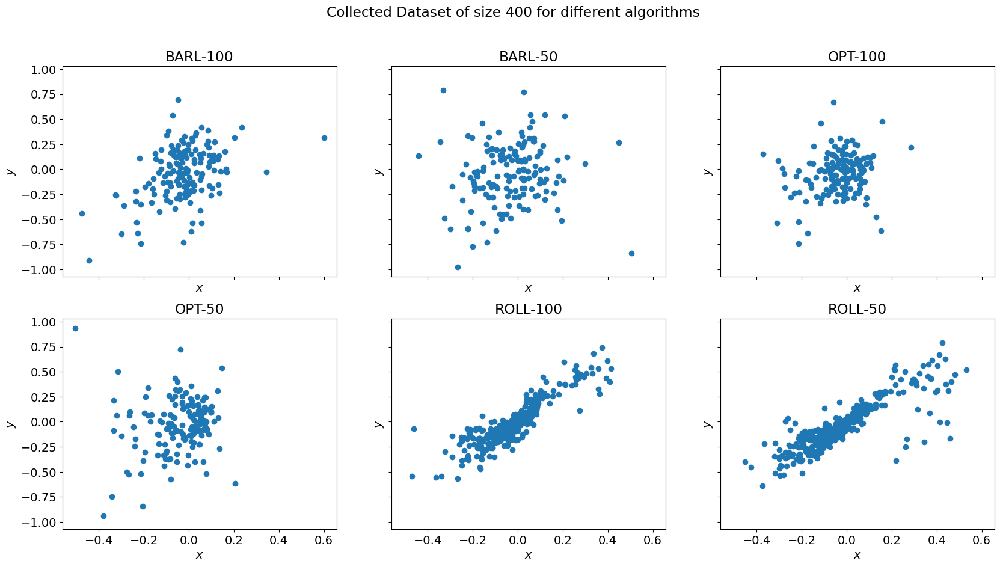

In [374]:
# sub_data = {key:value for key, value in data.items() if ('BARL' in key) and ('SHORT' in key)}
budget = 400
# cols = 3
items = len(sub_data.keys())
# rows = items//cols + items%cols
rows = 2 + len(data.keys())%2
cols = len(data.keys())//2

fig, ax = plt.subplots(rows, cols, figsize=(20, 10), sharex=True, sharey=True)
for index, (key, vals) in enumerate(data.items()):
    i = index//cols
    j = index%cols
    ax_i = ax[i,j]
    
    seed_0 = np.array(vals['X Seed'][0][:budget])
    x = seed_0[1:,0]
    y = seed_0[1:,1]
#     z = seed_0[1:,2]
#     act1 = seed_0[1:,3]
    
    plot = ax_i.scatter(x, y)#, c=z, cmap='RdYlGn', vmin=-1, vmax=1)
#     if j == cols-1: plt.colorbar(plot, ax=ax[j], label='act1')
    ax_i.title.set_text(key)
    ax_i.set_xlabel('$x$')
    ax_i.set_ylabel('$y$')
    
# plt.colorbar(plot, label='action: torque')
plt.suptitle(f'Collected Dataset of size {budget} for different algorithms')

plt.savefig(f'{save_path}dataset_{budget}_{env_name}.png', bbox_inches='tight')
plt.show()

2


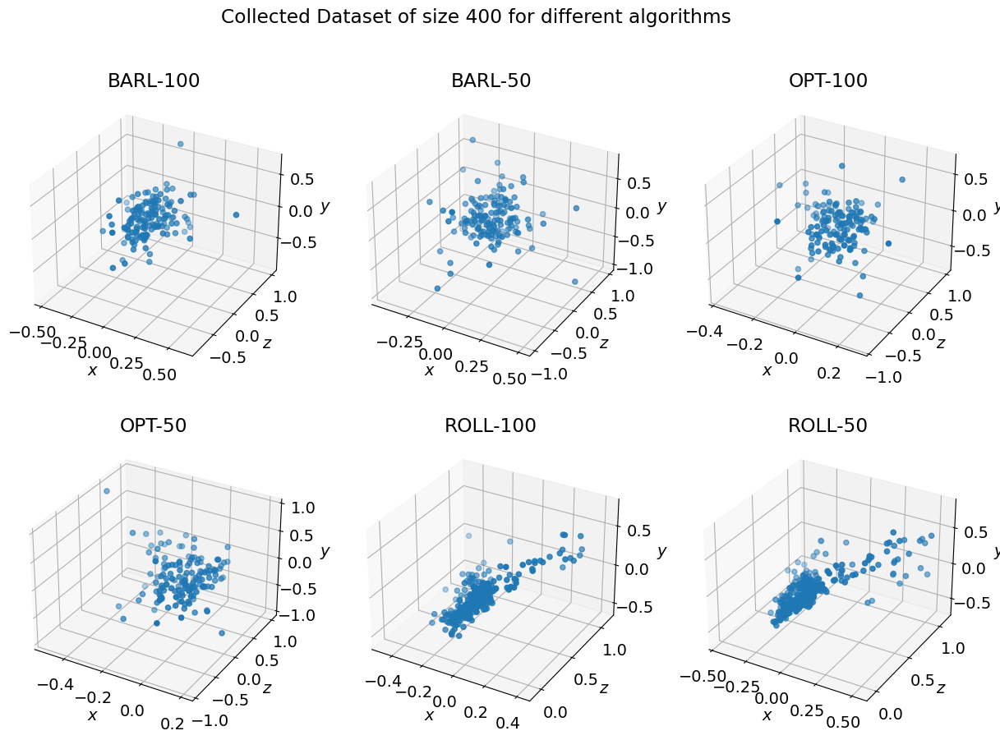

In [373]:
# 3D dataset
# sub_data = {key:value for key, value in data.items() }#if 'ID500' in key}
budget = 400
cols = 3
items = len(data.keys())
rows = items//cols + items%cols
print(rows)

fig = plt.figure(figsize=(15, 10))
for index, (key, vals) in enumerate(data.items()):
    ax = fig.add_subplot(rows, cols, index+1, projection='3d')
    
    seed_0 = np.array(vals['X Seed'][0][:budget])
    x = seed_0[1:,0]
    y = seed_0[1:,1]
    z = seed_0[1:,2]
    
#     ax_i.plot(x, y, z)
    plot = ax.scatter(x, z, y, marker='o')
    
    ax.title.set_text(key)
    ax.set_xlabel('$x$')
    ax.set_zlabel('$y$')
    ax.set_ylabel('$z$')
    
plt.suptitle(f'Collected Dataset of size {budget} for different algorithms')

plt.savefig(f'{save_path}dataset_3D_{budget}_{env_name}.png', bbox_inches='tight')
plt.show()

#### General

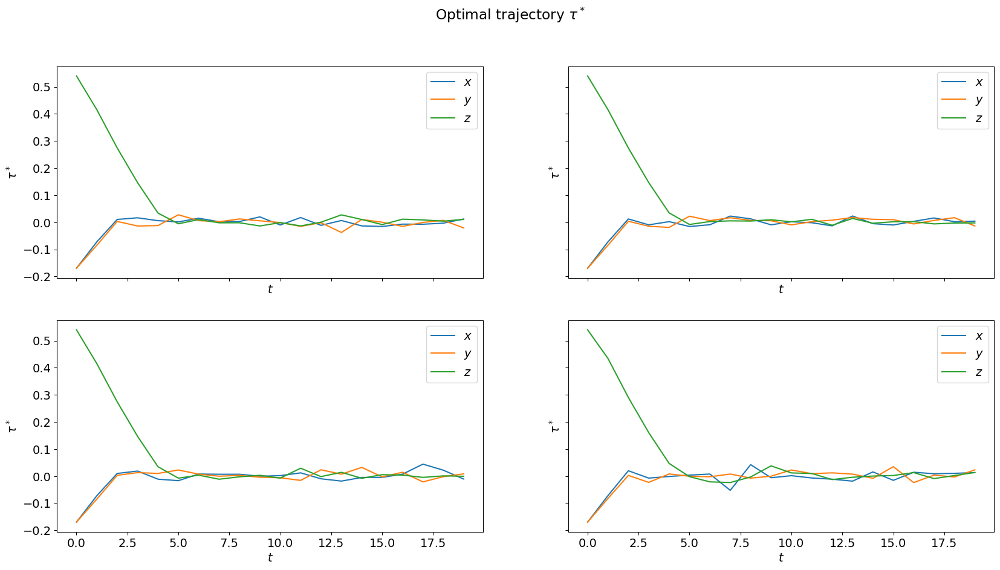

In [62]:
cols = 2
items = len(sub_data.keys())
rows = items//cols + items%cols

fig, ax = plt.subplots(rows, cols, figsize=(20, 10), sharex=True, sharey=True)
for index, (key, vals) in enumerate(sub_data.items()):
    i = index//cols
    j = index%cols
    ax_i = ax[i,j]
    
    seed_0 = np.array(vals['GT Paths'][0][0].x)
    x = seed_0[:, 0]
    y = seed_0[:, 1]
    z = seed_0[:, 2]
#     actions = seed_0[:, 3:]
    
    time = np.arange(len(x))
    
    ax_i.plot(time, x, label='$x$')
    ax_i.plot(time, y, label='$y$')
    ax_i.plot(time, z, label='$z$')
#     ax.plot(time, actions[:,0], label='$u_1$')
#     ax.plot(time, actions[:,1], label='$u_2$')
#     ax.plot(time, actions[:,2], label='$u_3$')
    
    ax_i.set_xlabel('$t$')
    ax_i.set_ylabel(r'$\tau^*$')
    ax_i.legend(loc=1)
    
plt.suptitle(rf'Optimal trajectory $\tau^*$')

# plt.savefig(f'{save_path}optimal_paths_{env_name}.png', bbox_inches='tight')
plt.show()

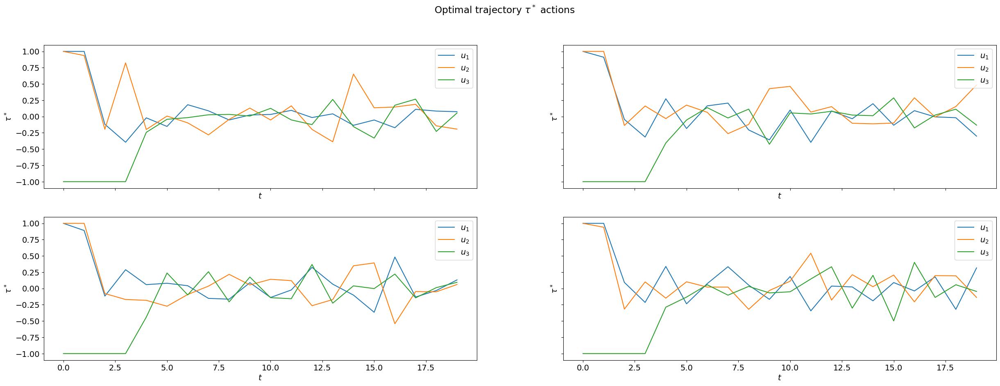

In [284]:
cols = 2
items = len(sub_data.keys())
rows = items//cols + items%cols

fig, ax = plt.subplots(rows, cols, figsize=(30, 10), sharex=True, sharey=True)
for index, (key, vals) in enumerate(sub_data.items()):
    i = index//cols
    j = index%cols
    ax_i = ax[i,j]
    
    seed_0 = np.array(vals['GT Paths'][0][0].x)
    u1 = seed_0[:, 3]
    u2 = seed_0[:, 4]
    u3 = seed_0[:, 5]
    
    time = np.arange(len(u1))
    ax_i.plot(time, u1, label='$u_1$')
    ax_i.plot(time, u2, label='$u_2$')
    ax_i.plot(time, u3, label='$u_3$')
    
    ax_i.set_xlabel('$t$')
    ax_i.set_ylabel(r'$\tau^*$')
    ax_i.legend(loc=1)
    
plt.suptitle(rf'Optimal trajectory $\tau^*$ actions')

# plt.savefig(f'{save_path}optimal_paths_actions_{env_name}.png', bbox_inches='tight')
plt.show()

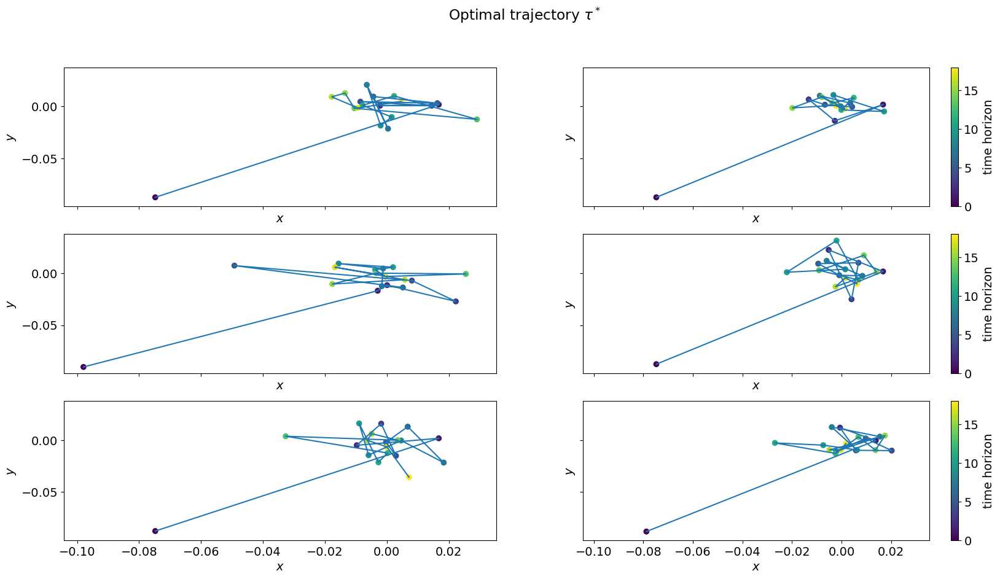

In [375]:
cols = 2
items = len(sub_data.keys())
rows = items//cols + items%cols

fig, ax = plt.subplots(rows, cols, figsize=(20, 10), sharex=True, sharey=True)
for index, (key, vals) in enumerate(sub_data.items()):
    i = index//cols
    j = index%cols
    ax_i = ax[i,j]
    
    seed_0 = np.array(vals['GT Paths'][0][0].x)
    x = seed_0[1:, 0]
    y = seed_0[1:, 1]
    z = seed_0[1:, 2]
#     actions = seed_0[:, 3:]
    
    ax_i.plot(x, y)
    time = np.arange(len(x))
    plot = ax_i.scatter(x, y, c=time)
    if j == cols-1: plt.colorbar(plot, ax=ax_i, label='time horizon')
    
    ax_i.set_xlabel('$x$')
    ax_i.set_ylabel('$y$')
    
plt.suptitle(rf'Optimal trajectory $\tau^*$')

# plt.savefig(f'{save_path}optimal_paths_2d_{env_name}.png', bbox_inches='tight')
plt.show()

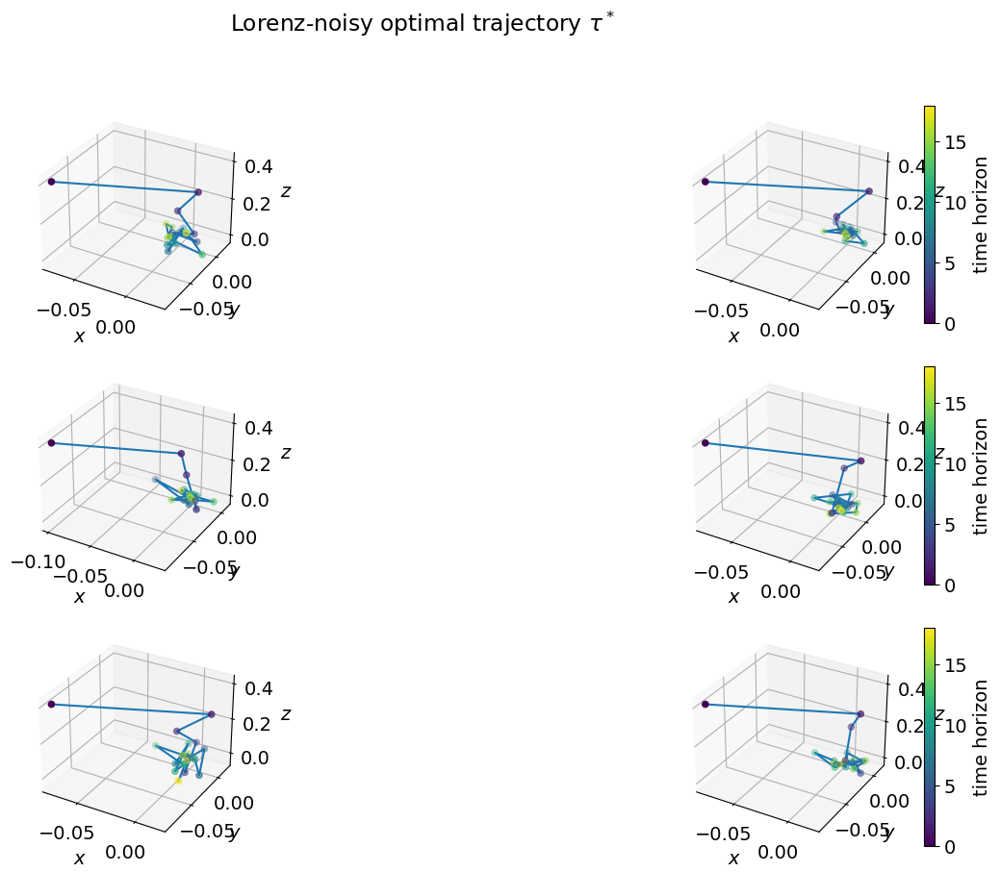

In [376]:
# 3D dataset
cols = 2
items = len(sub_data.keys())
rows = items//cols + items%cols

fig = plt.figure(figsize=(15, 10))
for index, (key, vals) in enumerate(sub_data.items()):
    ax = fig.add_subplot(rows, cols, index+1, projection='3d')
    
    seed_0 = np.array(vals['GT Paths'][0][0].x)
    x = seed_0[1:,0]
    y = seed_0[1:,1]
    z = seed_0[1:,2]
    
    ax.plot(x, y, z)
    time = np.arange(len(x))
    plot = ax.scatter(x, y, z, c=time)

    if index%cols == cols-1: plt.colorbar(plot, ax=ax, label='time horizon')
    
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    ax.set_zlabel('$z$')
    
plt.suptitle(rf'{env_name} optimal trajectory $\tau^*$')

# plt.savefig(f'{save_path}optimal_paths_3d_{env_name}.png', bbox_inches='tight')
plt.show()

In [176]:
# pd.DataFrame(data['ROLLOUT-1000']['X Seed'][0][1:]).describe()

In [177]:
# fig, ax = plt.subplots(figsize=(10, 6))
# action_dist = {}
# for i, (key, vals) in enumerate(data.items()):
#     if 'ROLL' in key:
#         action_dist[key] = (vals['X Seed'][:, :, 2].flatten())
# action_dist = pd.DataFrame.from_dict(action_dist)
# sns.boxplot(action_dist)
# plt.savefig(f'{save_path}distribution_actions_{env_name}.png', bbox_inches='tight')
# plt.show()

In [178]:
# budget = 50
# for index, (key, vals) in enumerate(data.items()):
#     print(key)
    
#     seed_0 = np.array(vals['X Seed'][0][:budget])
#     sns.jointplot(x=seed_0[:,0], y=seed_0[:,1], height=3)
#     plt.show()

### Animate Trajectories

In [181]:
from matplotlib import animation, rc
from IPython.display import HTML

#### Pendulum

In [63]:
# fig = plt.figure() 
# axis = plt.axes(xlim =(-1, 1.2),
#                 ylim =(-1, 1.2)) 
  
# line, = axis.plot([], [], lw = 2) 
# sctr = axis.scatter([], [], c=[], marker = 'o', cmap='RdYlGn', vmin=-1, vmax=1, s=80)
   
# # what will our line dataset
# # contain?
# def init(): 
#     line.set_data([], []) 
#     return line, 
   
# # initializing empty values
# # for x and y co-ordinates
# xdata, ydata = [], [] 
# center = (0, 0)
   
# # animation function 
# def animate(i): 
#     seed_0 = np.array(data['ROLL-BARL-1000']['X Seed'][0][i])
       
#     theta = seed_0[0]
#     velocity = seed_0[1]
#     torque = seed_0[2]
#     x = np.cos(theta) # np.cos(0)=1
#     y = np.sin(theta) # np.sin(0)=0
       
#     xdata = [0, x]
#     ydata = [0, y]
#     line.set_data(ydata, xdata) 
#     axis.scatter(y, x, c=torque, marker = 'o', cmap='RdYlGn', vmin=-1, vmax=1, s=80)
# #     print(xdata,ydata)
# #     axis.scatter(y, x, 'or')
# #     plt.plot(ydata,xdata)
# #     plt.plot(y,x,marker = 'o',markerfacecolor = 'g',markeredgecolor  = 'k',markersize = 15)
      
#     return line, 
   
# # calling the animation function     
# anim = animation.FuncAnimation(fig, animate, init_func = init, 
#                                frames = 151, interval = 10, blit = True) 
# # HTML(anim.to_jshtml())
# anim.save(f'{save_path}pendulum.gif', writer = 'pillow', fps = 30)
# # plt.show()
# plt.clf()

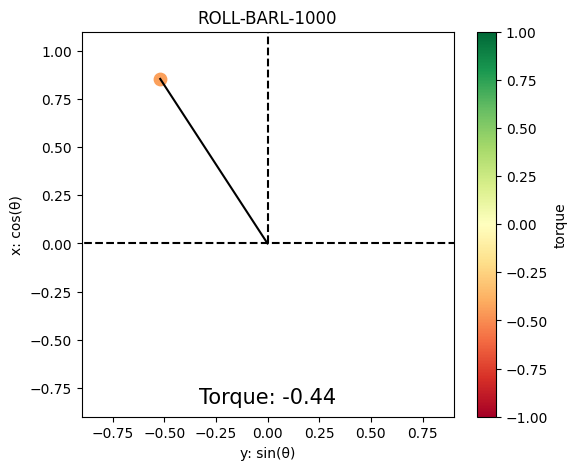

In [64]:
fig, ax = plt.subplots(figsize=(6,5))
ax.set_xlim(-.9,.9)
ax.set_ylim(-.9,1.1)
ax.set_title('ROLL-BARL-1000')
ax.set_ylabel('x: cos(θ)')
ax.set_xlabel('y: sin(θ)')
ax.plot([0, 0], [0, 1.1], '--k')
ax.plot([-1.1, 1.1], [0, 0], '--k')

seed_0 = np.array(data['ROLL-BARL-1000']['X Seed'][0][1])
       
theta = seed_0[0]
velocity = seed_0[1]
torque = seed_0[2]
x = np.cos(theta) # np.cos(0)=1
y = np.sin(theta) # np.sin(0)=0
xdata = [0, x]
ydata = [0, y]


pendulum = ax.plot(ydata, xdata, 'k')
sctr = ax.scatter(y, x, marker = 'o', c=torque, cmap='RdYlGn', vmin=-1, vmax=1, s=80)
plt.colorbar(sctr, ax=ax, label='torque')
label = ax.text(0, -0.8, f'Torque: {torque:.2f}', ha='center', va='center', fontsize=15)
plt.show()
plt.clf()

In [65]:
# plt.clf()
# fig, [ax, clb] = plt.subplots(1, 2, figsize=(5,5))
# # label = ax.text(0, -0.8, f'Torque: {0:.2f}', ha='center', va='center', fontsize=15)

# # text = 'You are welcome!'
# # txt = ax.text(.20, .5, text, fontsize=15)

# def animation_func(i):
#     seed_0 = np.array(data['ROLL-BARL-1000']['X Seed'][0][i])
       
#     theta = seed_0[0]
#     velocity = seed_0[1]
#     torque = seed_0[2]
#     x = np.cos(theta) # np.cos(0)=1
#     y = np.sin(theta) # np.sin(0)=0
#     xdata = [0, x]
#     ydata = [0, y]
    
#     fig.clf()
#     plt.xlim(-1,1)
#     plt.ylim(-1,1.2)
#     plt.suptitle('ROLL-BARL-1000')
#     fig.supylabel('x: cos(θ)')
#     fig.supxlabel('y: sin(θ)')
#     plt.plot([0, 0], [0, 1.1], '--k')
#     plt.plot([-1.1, 1.1], [0, 0], '--k')
    
#     plt.plot(ydata, xdata, 'k')
#     sctr = plt.scatter(y, x, marker = 'o', c=torque, cmap='RdYlGn', vmin=-1, vmax=1, s=80)
# #     plt.colorbar(sctr, ax=ax, label='torque')
#     label = ax.text(0, -0.8, f'Torque: {torque:.2f}', ha='center', va='center', fontsize=15)
# # cb1 = matplotlib.colorbar.ColorbarBase(ax=clb, #cmap='RdYlGn',
# #                             norm = matplotlib.colors.Normalize(vmin=-1, vmax=1),
# #                             orientation='vertical')
 
# anim = animation.FuncAnimation(fig, animation_func,
#                           frames = 151, interval = 500)
# # plt.colorbar(cb1, ax=ax, label='torque')
# anim.save(f'{save_path}pendulum.gif', writer = 'pillow', fps = 30)
# plt.clf()

In [103]:
def animate_trajectories(run_name, seed=0):
    plt.clf()
    fig = plt.figure(figsize=(6,5))

    # main axis
    axis = plt.axes(xlim =(-.9, .9),
                    ylim =(-.9, 1.1)) 
    axis.set_xlabel('y: sin(θ)')
    axis.set_ylabel('x: cos(θ)')
    axis.set_title(run_name)
    axis.plot([0, 0], [0, 1.1], '--k')
    axis.plot([-1.1, 1.1], [0, 0], '--k')

    line, = axis.plot([], [], 'k', lw = 2) 
    point, = axis.plot(0, 0, "o", lw = 5)
    label = axis.text(0, -0.8, f'Torque: {0:.2f}', ha='center', va='center', fontsize=15)

    #colorbar axis
    # clb = plt.axes()
    norm = matplotlib.colors.Normalize(vmin=-1, vmax=1)
    cmap = matplotlib.cm.get_cmap("RdYlGn")

    img = plt.imshow(np.array([[-1,1]]), cmap=cmap)
    img.set_visible(False)
    plt.colorbar(orientation="vertical", label="torque")

    # def init(): 
    #     line.set_data([], []) 
    #     return line, 


    # animation function 
    def animate(i): 
        seed_0 = np.array(data[run_name]['X Seed'][seed][i])

        theta = seed_0[0]
        velocity = seed_0[1]
        torque = seed_0[2]
        x = np.cos(theta) # np.cos(0)=1
        y = np.sin(theta) # np.sin(0)=0
        xdata = [0, x]
        ydata = [0, y]



        line.set_data(ydata, xdata) 
        point.set_data(y, x)
        point.set_color(cmap(norm(torque)))
        label.set_text(f'Torque: {torque:.2f}')

        return line, point, label

    # calling the animation function     
    anim = animation.FuncAnimation(fig, animate, #init_func = init, 
                                   frames = 151, interval = 1000, blit = True) 

    # saves the animation in our desktop
    anim.save(f'{save_path}trajectories_{env_name.lower()}_{run_name}.gif', writer = 'pillow', fps = 30)
    plt.clf()

In [104]:
for index, (key, vals) in tqdm(enumerate(data.items())):
    if 'ROLL' not in key: continue
    print(key)
    animate_trajectories(key)

0it [00:00, ?it/s]

ROLL-BARL-1000


9it [00:54,  6.02s/it]

ROLL-BARL-100


10it [01:48, 12.62s/it]

ROLL-BARL-50


11it [02:42, 19.48s/it]

ROLL-BARL-10


12it [03:36, 18.04s/it]


#### Lorenz

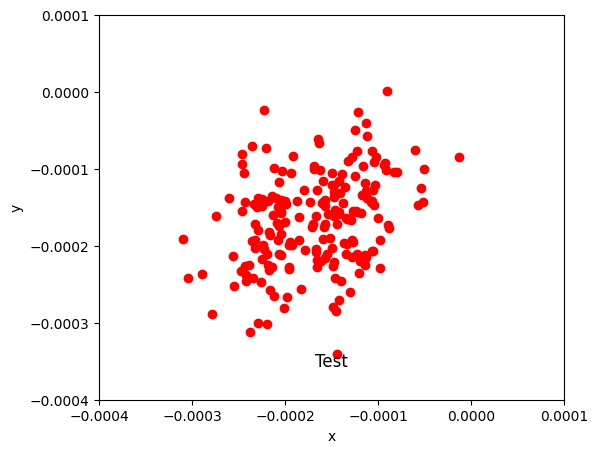

In [146]:
fig, ax = plt.subplots(figsize=(6,5))
#         axis = plt.axes(xlim = (-3e-4, -.1),
#                         ylim = (-3e-4, -.1),
#                        ) 
ax.set_xlim(-4e-4,1e-4)
ax.set_ylim(-4e-4,1e-4)
ax.set_title('')
ax.set_ylabel('y')
ax.set_xlabel('x')

seed_0 = np.array(data['FITTED-NEW-100']['X Seed'][0][:budget])
x = seed_0[1:,0]
y = seed_0[1:,1]
action = seed_0[1:,3:]

plot = ax.scatter(x, y, c='red')
# ax[i,j].title.set_text(key)
# ax[i,j].set_xlabel('x')
# ax[i,j].set_ylabel('y')

ax.text(-1.5e-4, -3.5e-4, 'Test', ha='center', va='center', fontsize=12)

# plt.suptitle(f'Collected Dataset of size {budget} for different algorithms')

plt.show()

In [281]:
pd.Series(data['ROLL-ID-100']['X Seed'][0][1:,2]).describe()

count    5.000000e+02
mean     5.365596e-10
std      6.396272e-11
min      3.542107e-10
25%      4.904826e-10
50%      5.389733e-10
75%      5.782097e-10
max      7.212544e-10
dtype: float64

In [205]:
def animate_lorenz(run_name, seed=0, threed=False):
    plt.clf()
    fig = plt.figure(figsize=(6,5))

    # main axis
    if threed:
        axis = plt.axes(xlim = (-1, 1),
                        ylim = (-1, 1),
                        zlim = (-1, 1),
                        projection='3d',
                       ) 
    else:
        axis = plt.axes(xlim = (-1, 1),
                        ylim = (-1, 1),
                       ) 
        
    axis.set_xlabel('x')
    axis.set_ylabel('y')
    if threed: axis.set_zlabel('z')
    axis.set_title(run_name)

    line, = axis.plot([], [], 'k', lw = 1) 
    point, = axis.plot(0, 0, "or", lw = 2)
    old_points, = axis.plot(0, 0, "ok", lw = 1)
    if threed: label = axis.text(0, -.75, -.75, '', ha='center', va='center', fontsize=12)
    else: label = axis.text(0, -0.75, '', ha='center', va='center', fontsize=12)
    
    xdata, ydata, zdata = [], [], []


    # animation function 
    def animate(i): 
        seed_0 = np.array(data[run_name]['X Seed'][seed][i+1])

        x = seed_0[0]
        y = seed_0[1]
        z = seed_0[2]
        action = seed_0[3:]
        if threed: axis.set_title(f'{run_name}\nAction: {action}')
        else: label.set_text(f'Action: {action}')
        
        if threed: old_points, = axis.plot3D(xdata, ydata, zdata, "ok", lw = 1)
        else: old_points, = axis.plot(xdata, ydata, "ok", lw = 1)
        
        xdata.append(x)
        ydata.append(y)
        zdata.append(z)
        
#         if threed: line, = axis.plot3D(xdata, ydata, zdata, 'k', lw=1)
#         else: line.set_data(xdata, ydata) 
    
        if threed: point, = axis.plot3D(x, y, z, "or", lw = 3)
        else: point, =axis.plot(x, y, "or", lw = 3)

        return line, point, label

    # calling the animation function     
    anim = animation.FuncAnimation(fig, animate, #init_func = init, 
                                   frames = 200, interval = 100_000, blit = True) 

    # saves the animation in our desktop
    name = 'trajectories' + ('_3D' if threed else '')
    anim.save(f'{save_path}{name}_{env_name.lower()}_{run_name}.gif', writer = 'pillow', fps = 30)
    plt.clf()

In [209]:
matplotlib.pyplot.close()
animate_lorenz('STATIC-100', threed=False)
matplotlib.pyplot.close()

In [203]:
data1=data

### Baselines

In [377]:
events = pd.read_csv("tensorboard_events.csv")
# events = events.loc[events['experiment'].str.contains('_bacpendulum-v0_t20000/')]
# events = events.loc[events['experiment'].str.contains('_lorenz-v0_t')]
events = events.loc[events['experiment'].str.contains('/lorenz-noisy/')]

# events = events.loc[events['experiment'].str.contains('_short')]
print(events['experiment'].unique())
events['experiment'] = events['experiment'].apply(lambda x: x.split('/')[-2].split('_')[0])#[:-2])
events = events.loc[events['step'] <= 30_000] # 169_454
events = events.sort_values(by=['experiment'])
print(events['experiment'].unique())
events

['./models/lorenz-noisy/TRPO_noisy_lorenz-v0_t30000/TRPO_1/events.out.tfevents.1692913314.n53.lab-ia.local.222699.1'
 './models/lorenz-noisy/TQC_lorenz-v0_t30000/TQC_1/events.out.tfevents.1692914174.n55.lab-ia.local.239089.1'
 './models/lorenz-noisy/SAC_lorenz-v0_t30000/SAC_1/events.out.tfevents.1692912050.n55.lab-ia.local.239089.0'
 './models/lorenz-noisy/DDPG_lorenz-v0_t30000/DDPG_noisy/events.out.tfevents.1692916225.n55.lab-ia.local.239089.2'
 './models/lorenz-noisy/PPO_noisy_lorenz-v0_t30000/PPO_1/events.out.tfevents.1692911669.n53.lab-ia.local.222699.0']
['DDPG' 'PPO' 'SAC' 'TQC' 'TRPO']


,step,tag,value,wall_time,experiment
410136,22844.0,train/critic_loss,6877.419922,1.692917e+09,DDPG
402578,9102.0,train/critic_loss,27959.353516,1.692917e+09,DDPG
402577,9100.0,train/critic_loss,35602.421875,1.692917e+09,DDPG
402576,9100.0,train/critic_loss,35602.421875,1.692917e+09,DDPG
402575,9098.0,train/critic_loss,35602.421875,1.692917e+09,DDPG
...,...,...,...,...,...
87122,28640.0,train/learning_rate,0.001000,1.692915e+09,TRPO
87123,28642.0,train/learning_rate,0.001000,1.692915e+09,TRPO
87124,28644.0,train/learning_rate,0.001000,1.692915e+09,TRPO
87111,28618.0,train/learning_rate,0.001000,1.692915e+09,TRPO


In [378]:
events[['experiment', 'step', 'value']].groupby('experiment')['step'].max()

experiment
DDPG    30000.0
PPO     30000.0
SAC     30000.0
TQC     30000.0
TRPO    30000.0
Name: step, dtype: float64

In [379]:
# events1=events

In [380]:
# sub_data = {key:val for key,val in data.items() if ('NOISY' not in key) }
# sub_data.keys()

In [381]:
from scipy.interpolate import make_interp_spline, BSpline
def pivot(df, index='step'):
    df =  pd.pivot_table(df, values=['value'], 
                                index=index,
                               columns=['tag'])
    df.columns = df.columns.get_level_values(1)
    return df

DDPG: max cumulative reward -736.4407958984375, final cumulative reward -770.4380493164062
sample complexity 1642.0
PPO: max cumulative reward -1425.872314453125, final cumulative reward -1442.071533203125
sample complexity 26626.0
SAC: max cumulative reward -721.4376831054688, final cumulative reward -728.2935180664062
sample complexity 786.0
TQC: max cumulative reward -717.4412231445312, final cumulative reward -731.2042236328125
sample complexity 688.0
TRPO: max cumulative reward -851.8629150390625, final cumulative reward -891.115478515625
sample complexity 16386.0


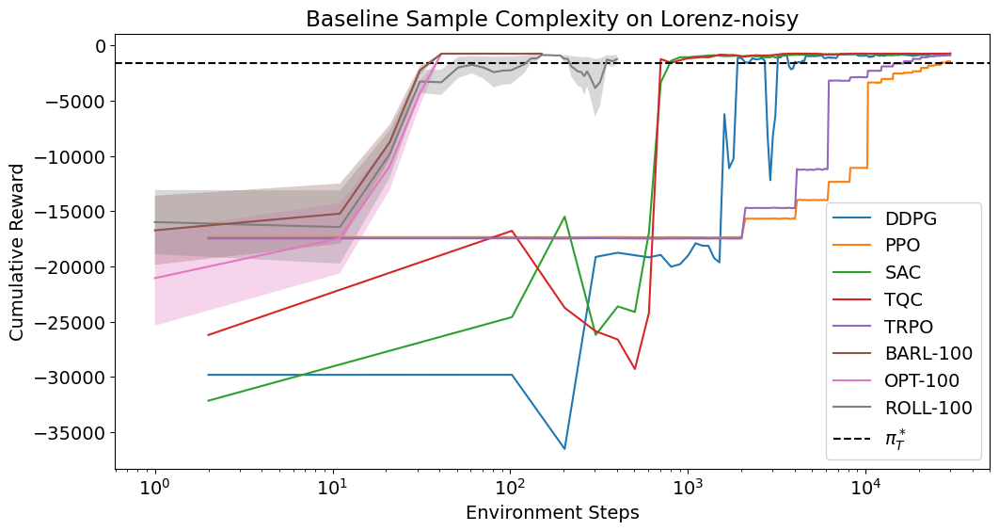

In [382]:
smoothing = True

fig, ax = plt.subplots(figsize=(12, 6))

# Baseline Data
for i, exp_name in enumerate(events['experiment'].unique()):
    experiment = events.loc[events['experiment'] == exp_name]
    experiment = pivot(experiment).reset_index()
#     exp_name = exp_name.split('/')[-2]
#     print(exp_name)
    
    step = experiment['step']#[:20480]
    mean_r = experiment['eval/mean cumulative reward']#[:len(step)]
    std_r = experiment['eval/std cumulative reward']#[:len(step)]
    
    print(f'{exp_name}: max cumulative reward {mean_r.max()}, final cumulative reward {np.array(mean_r)[-1]}')
    try:
        sample_idx = np.where(mean_r > gt_val)[0].min()
        print(f"sample complexity {step[sample_idx]}")
    except:
        print('n/a')
    
    if smoothing:
        x_new = np.linspace(step.min(), step.max(), 300) # smaller number, more smoothing
        spl = make_interp_spline(step, mean_r, k=3)  # type: BSpline
        mean_smooth = spl(x_new)
        ax.plot(x_new, mean_smooth, label=exp_name)#+" smoothed")
        ax.fill_between(x_new, mean_smooth, mean_smooth, alpha=0.3)
    else:
        ax.plot(step, mean_r, label=exp_name, zorder=100 - i)
        ax.fill_between(step, mean_r - std_r, mean_r + std_r, alpha=0.3)

# BARL Data
min_ndata = np.inf
temp_data = {key:val for key,val in data.items() if re.search(r'-100\b', key)}
for i, (key, vals) in enumerate(temp_data.items()):
    rmean = vals["Eval Mean Returns"]
    rstderr = vals["Eval Std Returns"]
    ndata = vals['Eval ndata']
    if max(ndata)  < min_ndata:
        min_ndata =   max(ndata)
    ax.plot(ndata[:len(rmean)], rmean, label=key, zorder=100 - i)
    ax.fill_between(ndata[:len(rmean)], rmean - rstderr, rmean + rstderr, alpha=0.3)

    
ax.set_xlabel('Environment Steps')
ax.set_ylabel('Cumulative Reward')
ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi^*_T$')

plt.title(f'Baseline Sample Complexity on {env_name}')
# plt.ylim(-200_000, 0)
plt.xscale('log')
plt.legend(loc='lower right')
plt.savefig(f'{save_path}Baseline_sample_complexity{"_smoothed" if smoothing else ""}_{env_name}.png', bbox_inches='tight')
plt.show()

In [58]:


# # 300 represents number of points to make between T.min and T.max
# x_new = np.linspace(np.min(ndata), np.max(ndata), 10) 

# spl = make_interp_spline(ndata, rmean, k=3)  # type: BSpline
# mean_smooth = spl(x_new)
# # spl = make_interp_spline(step, std_r, k=3)
# # std_smooth = spl(x_new)

# fig, ax = plt.subplots(figsize=(12, 8))
# plt.plot(ndata, rmean, label='actual')
# plt.fill_between(ndata, rmean - rstderr, rmean + rstderr, alpha=0.3)

# plt.plot(x_new, mean_smooth, label='smoothed')
# # plt.fill_between(x_new, mean_smooth, mean_smooth + std_smooth, mean_smooth - std_smooth, alpha=0.3)

# plt.xscale('log')
# plt.legend()
# plt.show()

In [384]:
import datetime

def wall_time_to_elapsed(wall_time):
    start = wall_time.min()
    return wall_time - start

pd.options.mode.chained_assignment = None

In [385]:
# events.loc[(events['experiment'] == 'DDPG') , 'wall_time'].max()

DDPG 1591.7999999523163
PPO 1197.5
SAC 2107.7999999523163
TQC 2035.5999999046326
TRPO 1117.7000000476837
BARL-100 829
OPT-100 919
ROLL-100 829


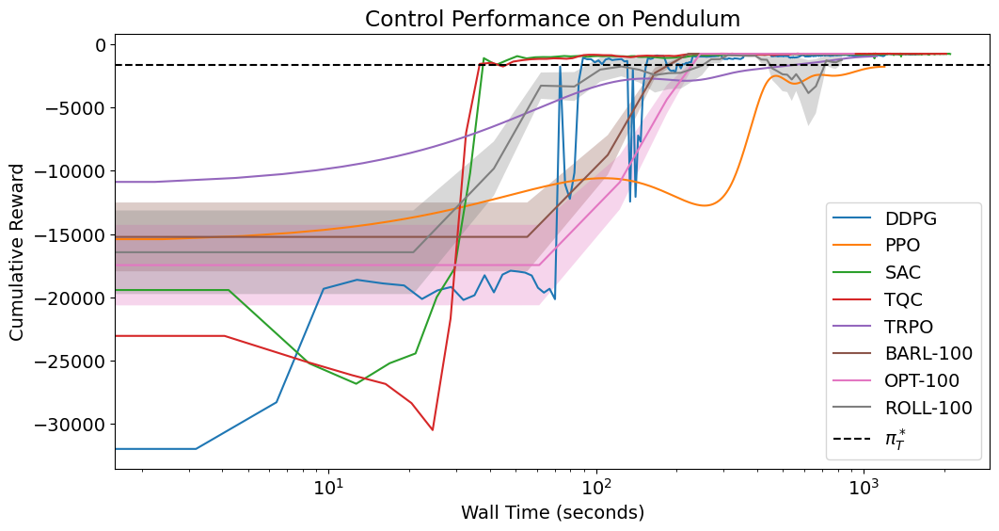

In [387]:
smoothing = True

fig, ax = plt.subplots(figsize=(12, 6))

# Baseline Data
for exp_name in events['experiment'].unique():
    experiment = events.loc[events['experiment'] == exp_name]
    experiment['wall_time'] = experiment['wall_time'].round(1)
    experiment = pivot(experiment, "wall_time").reset_index().dropna()
    experiment['wall_time'] = wall_time_to_elapsed(experiment['wall_time'])
    
    step = experiment['wall_time'].iloc[:-1]#[:1686851756]
    print(f"{exp_name} {step.max()}")
    mean_r = experiment['eval/mean cumulative reward'].iloc[:-1]
    std_r = experiment['eval/std cumulative reward'].iloc[:-1]
    
    if smoothing:
        x_new = np.linspace(step.min(), step.max(), 500) 
        spl = make_interp_spline(step, mean_r, k=3)  # type: BSpline
        mean_smooth = spl(x_new)
        ax.plot(x_new, mean_smooth, label=exp_name)#+" smoothed")
        ax.fill_between(x_new, mean_smooth, mean_smooth, alpha=0.3)
    else:
        ax.plot(step, mean_r, label=exp_name)
        ax.fill_between(step, mean_r - std_r, mean_r + std_r, alpha=0.3)

# """
# PENDULUM
# ROLLOUT-100: [2023-08-27 01:11:06] -> [2023-08-27 02:24:26]
# OPT-100: [2023-08-27 02:18:54] -> [2023-08-27 03:38:10]
# BARL-1000: [2023-08-26 22:40:27 -> [2023-08-26 23:58:13]
# """
# # BARL Data
# start = datetime.datetime(year=2023, month=8, day=27, hour=1, minute=11, second=6)
# end = datetime.datetime(year=2023, month=8, day=27, hour=2, minute=24, second=26)
# roll_elapsed = end - start

# start = datetime.datetime(year=2023, month=8, day=27, hour=2, minute=18, second=54)
# end = datetime.datetime(year=2023, month=8, day=27, hour=3, minute=58, second=13)
# opt_elapsed = end - start

# start = datetime.datetime(year=2023, month=8, day=26, hour=22, minute=40, second=27)
# end = datetime.datetime(year=2023, month=8, day=26, hour=23, minute=58, second=13)
# barl_elapsed = end - start

"""
LORENZ FIXED
ROLLOUT-100: [2023-08-24 12:33:49] -> [2023-08-24 16:27:13]
OPT-BARL-100: [2023-08-24 14:28:45] -> [2023-08-24 14:44:04]
BARL-100: [2023-08-24 14:25:10] -> [2023-08-24 14:38:59]
"""
start = datetime.datetime(year=2023, month=8, day=24, hour=12, minute=33, second=49)
end = datetime.datetime(year=2023, month=8, day=24, hour=16, minute=27, second=13)
roll_elapsed = end - start

start = datetime.datetime(year=2023, month=8, day=24, hour=14, minute=28, second=45)
end = datetime.datetime(year=2023, month=8, day=24, hour=14, minute=44, second=4)
opt_elapsed = end - start

start = datetime.datetime(year=2023, month=8, day=24, hour=14, minute=25, second=10)
end = datetime.datetime(year=2023, month=8, day=24, hour=14, minute=38, second=59)
barl_elapsed = end - start

for i, (key, vals) in enumerate(temp_data.items()):
    if 'ROLL' in key:
        elapsed = roll_elapsed
    if 'OPT' in key:
        elapsed = opt_elapsed
    else:
        elapsed = barl_elapsed
    print(f"{key} {elapsed.seconds}")
    
    rmean = vals["Eval Mean Returns"]
    rstderr = vals["Eval Std Returns"]
    ndata = np.linspace(0, elapsed.seconds, len(rmean))
    if max(ndata)  < min_ndata:
        min_ndata =   max(ndata)
    ax.plot(ndata[:len(rmean)], rmean, label=key)
    ax.fill_between(ndata[:len(rmean)], rmean - rstderr, rmean + rstderr, alpha=0.3)


ax.set_xlabel('Wall Time (seconds)')
ax.set_ylabel('Cumulative Reward')
ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi^*_T$')

plt.title('Control Performance on Pendulum')
plt.xscale('log')
plt.legend()
# plt.savefig(f'{save_path}Baseline_WallTime{"_smoothed" if smoothing else ""}_{env_name}.png', bbox_inches='tight')
plt.show()

In [389]:
experiment_paths = pd.read_csv("tensorboard_events.csv")['experiment'].unique()
# print(experiment_paths)
for path in experiment_paths:
#     if "bacpendulum" not in path: continue
    if "fixed" in path: continue
    if "_t2000000" in path: continue
    if 'REPLAY' in path: continue
    if 'STANDARD' in path: continue
    if 'TEST' in path: continue
    path = "/".join(path.split('/')[:-2])

    try:
        with open(rf'.{path}/info.pkl', 'rb') as f:
            info = pickle.load(f)
        print(path)
#         print(info.keys())
#         print(np.array(info['Action time']).shape)
        print(f"Timing of action prediction with {path}:")
        timing = np.array(info['Action time'])
        print(f"{timing.mean()} +- {timing.std()/np.sqrt(len(timing))} s")
        print(f"Cumulative reward with {path}:")
        returns = np.array(info['Returns'])[0]
        print(info['Returns'])
        print(f"{returns.mean()} +- {returns.std()/np.sqrt(len(returns))}")
            
    except Exception as err:
        print(err)
    print()
del experiment_paths

./models/lorenz-noisy/TRPO_noisy_lorenz-v0_t30000
Timing of action prediction with ./models/lorenz-noisy/TRPO_noisy_lorenz-v0_t30000:
0.0006435012817382812 +- 4.204560035673666e-06 s
Cumulative reward with ./models/lorenz-noisy/TRPO_noisy_lorenz-v0_t30000:
index 0 is out of bounds for axis 0 with size 0

./models/lorenz-noisy/TQC_lorenz-v0_t30000
Timing of action prediction with ./models/lorenz-noisy/TQC_lorenz-v0_t30000:
0.000651407241821289 +- 3.926827100572453e-06 s
Cumulative reward with ./models/lorenz-noisy/TQC_lorenz-v0_t30000:
index 0 is out of bounds for axis 0 with size 0

./models/lorenz-noisy/SAC_lorenz-v0_t30000
Timing of action prediction with ./models/lorenz-noisy/SAC_lorenz-v0_t30000:
0.0006524276733398438 +- 3.1333090489197663e-06 s
Cumulative reward with ./models/lorenz-noisy/SAC_lorenz-v0_t30000:
index 0 is out of bounds for axis 0 with size 0

./models/lorenz-noisy/DDPG_lorenz-v0_t30000
Timing of action prediction with ./models/lorenz-noisy/DDPG_lorenz-v0_t30000:
0.

In [69]:
def std_to_stderr(std, num_samples=5):
    return std/np.sqrt(num_samples)

std_to_stderr(86.943)

38.88209163355284

### Timing

In [319]:
# algorithm = extra
algorithm = data['BARL-100']

In [329]:
print(f"Timing of action prediction with MPC:")
timing = np.array(algorithm['Action Time Seed'])
print(f"{timing.mean()} +- {timing.std()} s")

fig = go.Figure()
fig.add_trace(go.Box(y=timing.flatten(), name="MPC"))
for exp_name in events['experiment'].unique():
    exp_name = exp_name.split('_')[0]
    try:
        path = f"../models/bacpendulum-v0/{exp_name}_bacpendulum-v0_t20000"
        with open(rf'{path}/info.pkl', 'rb') as f:
            info = pickle.load(f)
        print(f"Timing of action prediction with {exp_name}:")
        timing = np.array(info['Action time'])
        print(f"{timing.mean()} +- {timing.std()} s")
        fig.add_trace(go.Box(y=timing, name=exp_name))
    except Exception as err:
        pass
fig.show()

Timing of action prediction with MPC:
0.08901036531105637 +- 0.021878308757087465 s
Timing of action prediction with PPO:
0.00046387338638305663 +- 0.00024380082111021293 s
Timing of action prediction with SAC:
0.000808229923248291 +- 0.0004252553190695898 s
Timing of action prediction with TQC:
0.0007082676887512207 +- 0.0001793728926176085 s
Timing of action prediction with TRPO:
0.0004759924411773682 +- 7.324393143935456e-05 s


dict_keys(['BARL-1000', 'BARL-100', 'BARL-50', 'BARL-10', 'OPT-1000', 'OPT-100', 'OPT-50', 'OPT-10', 'ROLL-1000', 'ROLL-100', 'ROLL-50', 'ROLL-10'])


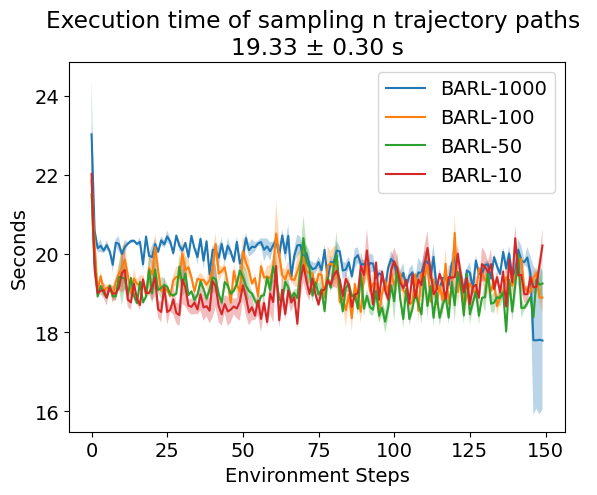

In [167]:
print(data.keys())
means = []
plt.figure()
for name, algorithm in data.items():
    if 'BARL' not in name: continue
    tpaths_mean = algorithm['Time Mean/Sample n execution paths']
    tpaths_std = algorithm['Time Std/Sample n execution paths']
    tmean = algorithm['Time/Sample n execution paths'].mean()
#     tstd = algorithm['Time/Sample n execution paths'].std()
    means.append(tmean)
    idx = np.arange(len(tpaths_mean))

    plt.plot(idx, tpaths_mean, label=name)
    plt.fill_between(idx, tpaths_mean - tpaths_std, tpaths_mean + tpaths_std, alpha=0.3)

plt.title(f'Execution time of sampling n trajectory paths \n{np.array(means).mean():.2f} ± {np.array(means).std():.2f} s')
plt.xlabel('Environment Steps')
plt.ylabel('Seconds')
plt.legend()
plt.savefig(f'{save_path}time_posterior_{env_name}.png', bbox_inches='tight')
plt.show()

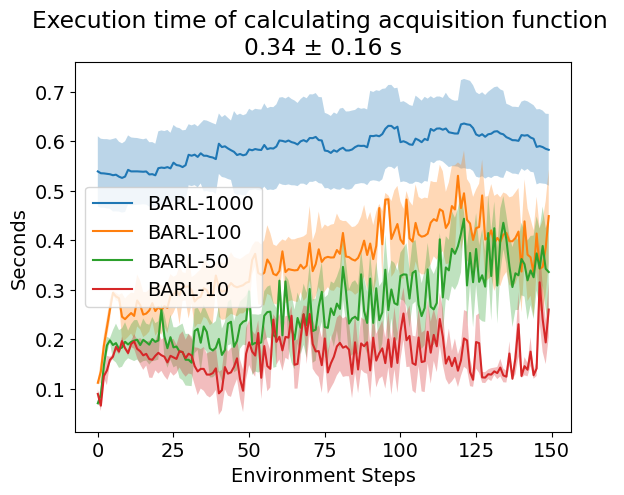

In [166]:
means = []
plt.figure()
for name, algorithm in data.items():
    if 'BARL' not in name: continue
    tacq_mean = algorithm['Time Mean/Acquisition function']
    tacq_std = algorithm['Time Std/Acquisition function']
    tmean = algorithm['Time/Acquisition function'].mean()
#     tstd = algorithm['Time/Acquisition function'].std()
    means.append(tmean)
    idx = np.arange(len(tacq_mean))

    plt.plot(idx, tacq_mean, label=name)
    plt.fill_between(idx, tacq_mean - tacq_std, tacq_mean + tacq_std, alpha=0.3)

plt.title(f'Execution time of calculating acquisition function \n{np.array(means).mean():.2f} ± {np.array(means).std():.2f} s')
plt.xlabel('Environment Steps')
plt.ylabel('Seconds')
plt.legend()
plt.savefig(f'{save_path}time_acquisition_{env_name}.png', bbox_inches='tight')
plt.show()

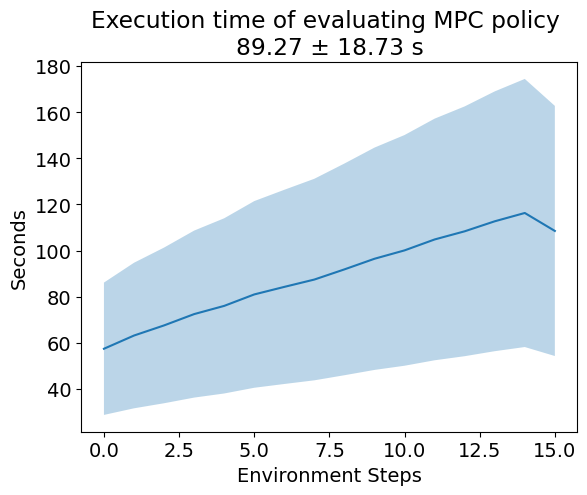

In [165]:
algorithm = data['BARL-1000']
plt.figure()
tmpc_mean = algorithm['Time Mean/Evaluate MPC policy']
tmpc_std = algorithm['Time Std/Evaluate MPC policy']
tmean = algorithm['Time/Evaluate MPC policy'].mean()
tstd = algorithm['Time/Evaluate MPC policy'].std()
idx = np.arange(len(tmpc_mean))

plt.plot(idx, tmpc_mean)
plt.fill_between(idx, tmpc_mean - tmpc_std, tmpc_mean + tmpc_std, alpha=0.3)

plt.title(f'Execution time of evaluating MPC policy \n{tmean:.2f} ± {tstd:.2f} s')
plt.xlabel('Environment Steps')
plt.ylabel('Seconds')
plt.savefig(f'{save_path}time_mpc_{env_name}.png', bbox_inches='tight')
plt.show()

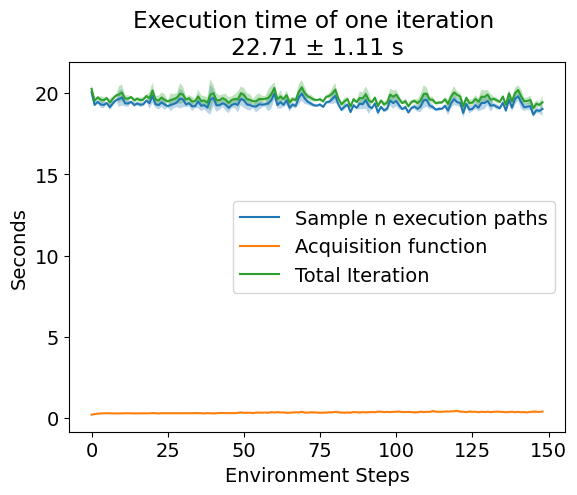

In [164]:
path_means, acq_means, total_means = [], [], []
plt.figure()
for name, algorithm in data.items():
    if 'BARL' not in name: continue
    tpaths_mean = algorithm['Time Mean/Sample n execution paths'][1:]
#     tpaths_std = algorithm['Time Std/Sample n execution paths'][1:]
    path_means.append(tpaths_mean)
#     idx = np.arange(len(tpaths_mean))

#     plt.plot(idx, tpaths_mean, label="Sample n execution paths")
#     plt.fill_between(idx, tpaths_mean - tpaths_std, tpaths_mean + tpaths_std, alpha=0.3)

    tacq_mean = algorithm['Time Mean/Acquisition function'][1:]
#     tacq_std = algorithm['Time Std/Acquisition function'][1:]
    acq_means.append(tacq_mean)
#     idx = np.arange(len(tacq_mean))

#     plt.plot(idx, tacq_mean, label="Acquisition function")
#     plt.fill_between(idx, tacq_mean - tacq_std, tacq_mean + tacq_std, alpha=0.3)

    t_mean = algorithm['Time Mean/Iteration'][1:]
#     t_std = algorithm['Time Std/Iteration'][1:]
    total_means.append(t_mean)
#     idx = np.arange(len(t_mean))

#     plt.plot(idx, t_mean, label="Total Iteration")
#     plt.fill_between(idx, t_mean - t_std, t_mean + t_std, alpha=0.3)

#     tmean = algorithm['Time/Iteration'].mean()
#     tstd = algorithm['Time/Iteration'].std()
    # tstd_err = std_to_stderr(tstd)
#     means.append(tmean)

tpaths_mean = np.array(path_means).mean(axis=0)
idx = np.arange(len(tpaths_mean))
plt.plot(idx, tpaths_mean, label="Sample n execution paths")
plt.fill_between(idx, tpaths_mean - tpaths_std, tpaths_mean + tpaths_std, alpha=0.3)

tacq_mean = np.array(acq_means).mean(axis=0)
plt.plot(idx, tacq_mean, label="Acquisition function")
plt.fill_between(idx, tacq_mean - tacq_std, tacq_mean + tacq_std, alpha=0.3)

t_mean = np.array(total_means).mean(axis=0)
plt.plot(idx, t_mean, label="Total Iteration")
plt.fill_between(idx, t_mean - t_std, t_mean + t_std, alpha=0.3)

tmean = algorithm['Time/Iteration'].mean()
tstd = algorithm['Time/Iteration'].std()

plt.title(f'Execution time of one iteration \n{tmean:.2f} ± {tstd:.2f} s')
plt.xlabel('Environment Steps')
plt.ylabel('Seconds')
# plt.yscale('log')
plt.legend()
plt.savefig(f'{save_path}time_iteration_{env_name}.png', bbox_inches='tight')
plt.show()

In [54]:
fig = go.Figure()

path = f"../environments/lorenz-v0"
with open(rf'{path}/info.pkl', 'rb') as f:
    info = pickle.load(f)
fig.add_trace(go.Box(y=info['Step time'], name="lorenz-v0"))

path = f"../environments/bacpendulum-v0"
with open(rf'{path}/info.pkl', 'rb') as f:
    info = pickle.load(f)
fig.add_trace(go.Box(y=info['Step time'], name="bacpendulum-v0"))

fig.show()

In [55]:
# plt.figure()

# x = np.linspace(0, 1000, 1000)
# plt.plot(x[:200], (40+0.5)*x[:200], label='a')
# plt.plot(x, (10+0.5)*x, label='b')

# plt.legend()
# plt.show()

## Buffer

In [276]:
events = pd.read_csv("tensorboard_events.csv")
# print(events['experiment'].unique())
events = events.loc[(events['experiment'].str.contains('/replay')) | (events['experiment'].str.contains('_bacpendulum-v0_t20000/'))]
events = events.loc[(events['experiment'].str.contains('SAC')) | (events['experiment'].str.contains('DDPG'))]

events['experiment'] = events['experiment'].apply(lambda x: x.split('/')[-2])#.split('_')[:-1])#[:-2])
events = events.loc[events['step'] <= 30_000] 
events = events.sort_values(by=['experiment'])
print(events['experiment'].unique())
events

['DDPG_1' 'DDPG_REPLAY_DATA_1' 'DDPG_REPLAY_GP_1'
 'DDPG_REPLAY_GP_WARMUP_1' 'DDPG_REPLAY_GP_WARMUP_2' 'DDPG_STANDARD_1'
 'SAC_1' 'SAC_REPLAY_DATA_1' 'SAC_REPLAY_GP_1' 'SAC_REPLAY_GP_WARMUP_1'
 'SAC_REPLAY_GP_WARMUP_2' 'SAC_STANDARD_1']


,step,tag,value,wall_time,experiment
2292102,2.0,eval/mean cumulative reward,-1388.889160,1.686847e+09,DDPG_1
2642106,10016.0,eval/std cumulative reward,80.392654,1.686849e+09,DDPG_1
2642105,10014.0,eval/std cumulative reward,123.663376,1.686849e+09,DDPG_1
2642104,10012.0,eval/std cumulative reward,13.766015,1.686849e+09,DDPG_1
2642103,10010.0,eval/std cumulative reward,74.026619,1.686849e+09,DDPG_1
...,...,...,...,...,...
7297764,174.0,eval/mean cumulative reward,-1413.264282,1.693155e+09,SAC_STANDARD_1
7297765,176.0,eval/mean cumulative reward,-1369.066406,1.693155e+09,SAC_STANDARD_1
7297766,178.0,eval/mean cumulative reward,-1223.696533,1.693155e+09,SAC_STANDARD_1
7297756,158.0,eval/mean cumulative reward,-1028.019653,1.693155e+09,SAC_STANDARD_1


In [277]:
events[['experiment', 'step', 'value']].groupby('experiment')['step'].max()

experiment
DDPG_1                     30000.0
DDPG_REPLAY_DATA_1         30000.0
DDPG_REPLAY_GP_1           30000.0
DDPG_REPLAY_GP_WARMUP_1    30000.0
DDPG_REPLAY_GP_WARMUP_2    30000.0
DDPG_STANDARD_1            30000.0
SAC_1                      20000.0
SAC_REPLAY_DATA_1          30000.0
SAC_REPLAY_GP_1            30000.0
SAC_REPLAY_GP_WARMUP_1     30000.0
SAC_REPLAY_GP_WARMUP_2     30000.0
SAC_STANDARD_1             30000.0
Name: step, dtype: float64

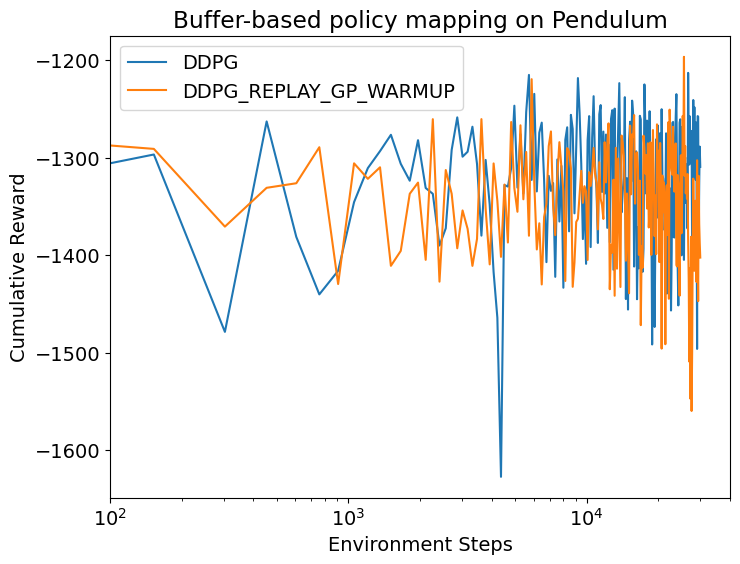

In [304]:
smoothing = True
keep = ['DDPG_1', 'REPLAY_GP_WARMUP_2']

fig, ax = plt.subplots(figsize=(8, 6))

# Baseline Data
for i, exp_name in enumerate(events['experiment'].unique()):
    if 'DDPG' not in exp_name: continue
    if not any(match in exp_name for match in keep): continue
    experiment = events.loc[events['experiment'] == exp_name]
    experiment = pivot(experiment).reset_index()
    exp_name = exp_name[:-2]
#     print(exp_name)
    
    step = experiment['step']#[:20480]
    mean_r = experiment['eval/mean cumulative reward']#[:len(step)]
    std_r = experiment['eval/std cumulative reward']#[:len(step)]
    
#     print(f'{exp_name}: max cumulative reward {mean_r.max()}, final cumulative reward {np.array(mean_r)[-1]}')
#     try:
#         sample_idx = np.where(mean_r > gt_val)[0].min()
#         print(f"sample complexity {step[sample_idx]}")
#     except:
#         print('n/a')
    
    if smoothing:
        x_new = np.linspace(step.min(), step.max(), 200) # smaller number, more smoothing
        spl = make_interp_spline(step, mean_r, k=3)  # type: BSpline
        mean_smooth = spl(x_new)
        ax.plot(x_new, mean_smooth, label=exp_name)#+" smoothed")
        ax.fill_between(x_new, mean_smooth, mean_smooth, alpha=0.3)
    else:
        ax.plot(step, mean_r, label=exp_name, zorder=100 - i)
        ax.fill_between(step, mean_r - std_r, mean_r + std_r, alpha=0.3)

    
ax.set_xlabel('Environment Steps')
ax.set_ylabel('Cumulative Reward')
# ax.axhline(gt_val, color='black', linestyle='--', label=r'$\pi^*_T$')

plt.title(f'Buffer-based policy mapping on {env_name}')
plt.xscale('log')
plt.xlim(100, 40_000)
plt.legend()#loc='upper left')
plt.savefig(f'{save_path}buffer_DDPG_{env_name}.png', bbox_inches='tight')
plt.show()

# END